# Importing Libraries and Configuring values

In [1]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt
from glob import glob
from PIL import Image
from tqdm import tqdm
from scipy.linalg import sqrtm
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
import warnings
warnings.filterwarnings("ignore")

# Config
IMAGE_SIZE = 128
LATENT_DIM = 100
BATCH_SIZE = 64
EPOCHS = 50
DATA_DIR = "/kaggle/input/pokemon-images-dataset/pokemon_jpg/pokemon_jpg/"
SAVE_DIR = "/kaggle/working/generated_pokemon/"
os.makedirs(SAVE_DIR, exist_ok=True)

# Loading and processing images

In [2]:
def load_images(data_dir, image_size):
    image_paths = glob(os.path.join(data_dir, "*.jpg"))
    print(f"🧾 Found {len(image_paths)} images.")
    images = []
    for path in tqdm(image_paths[:2000]):
        img = Image.open(path).convert("RGB").resize((image_size, image_size))
        img = np.asarray(img).astype(np.float32)
        img = (img - 127.5) / 127.5
        images.append(img)
    return np.array(images)

all_images = load_images(DATA_DIR, IMAGE_SIZE)

🧾 Found 819 images.


100%|██████████| 819/819 [00:08<00:00, 98.19it/s] 


# Train Test Split

In [3]:
from sklearn.model_selection import train_test_split

# Split the dataset into train and test sets
train_images, test_images = train_test_split(all_images, test_size=0.2, random_state=42)

print(f"✅ Train Images: {len(train_images)}")
print(f"✅ Test Images:  {len(test_images)}")

✅ Train Images: 655
✅ Test Images:  164


# Standard Model (Default tf 2.x model)

## Generator

In [4]:
def make_generator():
    model = tf.keras.Sequential([
        layers.Dense(16 * 16 * 256, input_dim=LATENT_DIM),
        layers.Reshape((16, 16, 256)),
        layers.BatchNormalization(),
        layers.ReLU(),

        layers.Conv2DTranspose(128, 4, strides=2, padding='same'),  # 32x32
        layers.BatchNormalization(),
        layers.ReLU(),

        layers.Conv2DTranspose(64, 4, strides=2, padding='same'),   # 64x64
        layers.BatchNormalization(),
        layers.ReLU(),

        layers.Conv2DTranspose(3, 4, strides=2, padding='same', activation='tanh')  # 128x128
    ])
    return model

## Discriminator

In [5]:
def make_discriminator():
    model = tf.keras.Sequential([
        layers.Conv2D(64, 4, strides=2, padding='same', input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3)),
        layers.LeakyReLU(0.2),
        layers.Conv2D(128, 4, strides=2, padding='same'),
        layers.LeakyReLU(0.2),
        layers.Flatten(),
        layers.Dense(1, activation='sigmoid')
    ])
    return model

# Custome Model( Upgraded from tf 1.x to tf 2.x)

## Adding Normalzation
to help with dropout

In [6]:
class InstanceNormalization(tf.keras.layers.Layer):
    def __init__(self, epsilon=1e-5, **kwargs):
        super().__init__(**kwargs)
        self.epsilon = epsilon

    def call(self, inputs):
        mean, var = tf.nn.moments(inputs, [1, 2], keepdims=True)
        return (inputs - mean) / tf.sqrt(var + self.epsilon)

## Generator

In [7]:
def generator():
    inputs = tf.keras.Input(shape=(LATENT_DIM,))
    x = layers.Dense(8 * 8 * 1024)(inputs)
    x = layers.Reshape((8, 8, 1024))(x)
    x = layers.LeakyReLU()(x)

    for filters in [512, 256, 128, 64]:
        x = layers.Conv2DTranspose(filters, 5, strides=2, padding='same')(x)
        x = InstanceNormalization()(x)
        x = layers.LeakyReLU()(x)
        x = layers.Dropout(0.3)(x)

    x = layers.Conv2DTranspose(3, 5, strides=1, padding='same', activation='tanh')(x)
    return tf.keras.Model(inputs, x, name="custom_generator")

## Discriminator

In [8]:
def discriminator():
    inputs = tf.keras.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    x = inputs

    for filters, strides in zip([64, 128, 256, 512, 1024], [2, 2, 2, 1, 2]):
        x = layers.Conv2D(filters, 5, strides=strides, padding='same')(x)
        x = layers.LeakyReLU()(x)
        x = layers.Dropout(0.3)(x)

    x = layers.Flatten()(x)
    x = layers.Dense(1, activation='sigmoid')(x)
    return tf.keras.Model(inputs, x, name="custom_discriminator")

# Adding images inside training

In [9]:
def show_real_fake_pairs(generator, real_batch, epoch, model_name):
    noise = tf.random.normal([real_batch.shape[0], LATENT_DIM])
    fake_batch = generator(noise, training=False)

    fig, axs = plt.subplots(1, real_batch.shape[0], figsize=(real_batch.shape[0] * 2, 2))
    for i in range(real_batch.shape[0]):
        merged = np.concatenate([(real_batch[i] + 1)/2, (fake_batch[i] + 1)/2], axis=1)  # side by side
        axs[i].imshow(merged)
        axs[i].axis('off')
    plt.suptitle(f"{model_name} - Real vs Fake (Epoch {epoch})")
    plt.tight_layout()
    plt.show()

# Adding fid tracking and graphs for better understanding

In [10]:
def plot_fid_curve(fid_scores, model_name, start_epoch=10, interval=10):
    x_epochs = list(range(start_epoch, start_epoch + len(fid_scores)*interval, interval))

    plt.figure(figsize=(10, 5))
    plt.plot(x_epochs, fid_scores, marker='o')
    for i, fid in enumerate(fid_scores):
        plt.text(x_epochs[i], fid + 5, f"{fid:.1f}", ha='center', fontsize=8)
    plt.title(f"FID Over Epochs - {model_name}")
    plt.xlabel("Epoch")
    plt.ylabel("FID Score")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Traning Function( customized to work for both the models)

In [11]:
def train_dcgan(generator, discriminator, images, model_name):
    model_dir = os.path.join(SAVE_DIR, model_name)
    os.makedirs(model_dir, exist_ok=True)

    cross_entropy = tf.keras.losses.BinaryCrossentropy()
    gen_opt = tf.keras.optimizers.Adam(1e-4)
    disc_opt = tf.keras.optimizers.Adam(1e-4)
    dataset = tf.data.Dataset.from_tensor_slices(images).shuffle(1000).batch(BATCH_SIZE)

    fid_scores = []
    fixed_real_batch = images[:5]  # same 5 real samples across all epochs

    @tf.function
    def train_step(real_images):
        noise = tf.random.normal([BATCH_SIZE, LATENT_DIM])
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            fake_images = generator(noise, training=True)
            real_output = discriminator(real_images, training=True)
            fake_output = discriminator(fake_images, training=True)
            gen_loss = cross_entropy(tf.ones_like(fake_output), fake_output)
            disc_loss = cross_entropy(tf.ones_like(real_output), real_output) + \
                        cross_entropy(tf.zeros_like(fake_output), fake_output)
        gen_opt.apply_gradients(zip(gen_tape.gradient(gen_loss, generator.trainable_variables), generator.trainable_variables))
        disc_opt.apply_gradients(zip(disc_tape.gradient(disc_loss, discriminator.trainable_variables), discriminator.trainable_variables))
        return gen_loss, disc_loss

    def save_generated_images(generator, epoch):
        noise = tf.random.normal([16, LATENT_DIM])
        predictions = generator(noise, training=False)
        predictions = (predictions + 1) / 2.0
        fig = plt.figure(figsize=(8, 2))
        for i in range(16):
            plt.subplot(2, 8, i + 1)
            plt.imshow(predictions[i])
            plt.axis('off')
        plt.tight_layout()
        plt.savefig(os.path.join(model_dir, f"epoch_{epoch:03d}.png"))
        plt.close()

    for epoch in range(1, EPOCHS + 1):
        for real_images in dataset:
            g_loss, d_loss = train_step(real_images)

        print(f"Epoch {epoch} - G: {g_loss:.4f} | D: {d_loss:.4f}")

        if epoch % 10 == 0:
            # Show real-fake horizontal comparison
            show_real_fake_pairs(generator, fixed_real_batch, epoch, model_name)

            # Save image grid
            save_generated_images(generator, epoch)

            # Generate fake images for FID
            fake_path = os.path.join(SAVE_DIR, f"fid_{model_name}")
            generate_fid_images(generator, fake_path, n_images=500)

            # Save real images only once
            real_path = os.path.join(SAVE_DIR, "fid_real")
            if epoch == 10 and not os.path.exists(real_path):
                os.makedirs(real_path, exist_ok=True)
                for i in range(500):
                    img = (images[i] + 1) * 127.5
                    Image.fromarray(img.astype(np.uint8)).save(f"{real_path}/{i:04d}.png")

            # FID calculation
            fid = calculate_fid(real_path, fake_path)
            fid_scores.append(fid)
            print(f"🔥 FID at Epoch {epoch}: {fid:.2f}")

    # Plot FID curve at end of training
    plot_fid_curve(fid_scores, model_name, start_epoch=10)

# Check the FID Score

> Fréchet Inception Distance (FID)

* It is used to evaluate the quality of images generated by generative models
* It measures the distance between the distributions of features extracted from real and generated images using the Inception network (a pre-trained convolutional neural network).

In [12]:
def generate_fid_images(generator, path, n_images=500):
    os.makedirs(path, exist_ok=True)
    for i in range(n_images):
        noise = tf.random.normal([1, LATENT_DIM])
        fake = generator(noise, training=False)
        fake = (fake + 1) / 2.0
        img = (fake[0].numpy() * 255).astype(np.uint8)
        Image.fromarray(img).save(os.path.join(path, f"{i:04d}.png"))

def load_fid_images(path):
    paths = glob(os.path.join(path, "*.png"))
    imgs = []
    for p in paths:
        img = Image.open(p).convert("RGB").resize((299, 299))
        imgs.append(np.asarray(img).astype(np.float32))
    return preprocess_input(np.array(imgs))

def calculate_fid(real_path, fake_path):
    model = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))
    act1 = model.predict(load_fid_images(real_path), verbose=0)
    act2 = model.predict(load_fid_images(fake_path), verbose=0)
    mu1, sigma1 = act1.mean(axis=0), np.cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), np.cov(act2, rowvar=False)
    ssdiff = np.sum((mu1 - mu2) ** 2)
    covmean = sqrtm(sigma1 @ sigma2)
    if np.iscomplexobj(covmean): covmean = covmean.real
    return ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)

# Real-vs-Fake Classifier

In [13]:
def load_classifier_data(generator, real_images, n=1000, augment_real=True, label_smoothing=True):
    # Safely get n real images from given dataset
    X_real = real_images[:n]
    
    # Optional data augmentation
    if augment_real:
        X_real_aug = []
        for img in X_real:
            try:
                aug_img = tf.image.random_flip_left_right(img).numpy()
                X_real_aug.append(aug_img)
            except:
                continue
        X_real = np.array(X_real_aug)

    # Adjust label length
    n_real = len(X_real)
    y_real = np.ones((n_real,))
    if label_smoothing:
        y_real *= 0.9

    # Generate fake samples with same shape
    X_fake = []
    while len(X_fake) < n_real:
        noise = tf.random.normal([1, LATENT_DIM])
        img = generator(noise, training=False)[0].numpy()
        if img.shape == X_real[0].shape:
            X_fake.append(img)
    X_fake = np.array(X_fake)
    y_fake = np.zeros((n_real,))
    if label_smoothing:
        y_fake += 0.1

    # Combine
    X = np.concatenate([X_real, X_fake])
    y = np.concatenate([y_real, y_fake])

    print(f"✅ Final shape: X={X.shape}, y={y.shape}")
    return train_test_split(X, y, test_size=0.2, random_state=42)

def build_classifier():
    model = tf.keras.Sequential([
        layers.Conv2D(32, 3, activation='relu', input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3)),
        layers.MaxPooling2D(),
        layers.BatchNormalization(),
        layers.Conv2D(64, 3, activation='relu'),
        layers.MaxPooling2D(),
        layers.BatchNormalization(),
        layers.Conv2D(128, 3, activation='relu'),
        layers.GlobalAveragePooling2D(),
        layers.Dropout(0.4),
        layers.Dense(64, activation='relu'),
        layers.Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Training

## Standard Model

Epoch 1 - G: 1.6556 | D: 0.2307
Epoch 2 - G: 2.7014 | D: 0.0971
Epoch 3 - G: 2.7194 | D: 0.0743
Epoch 4 - G: 2.2317 | D: 0.1615
Epoch 5 - G: 3.3977 | D: 0.0549
Epoch 6 - G: 3.3539 | D: 0.0473
Epoch 7 - G: 3.8458 | D: 0.0532
Epoch 8 - G: 4.4062 | D: 0.0235
Epoch 9 - G: 4.1369 | D: 0.0250
Epoch 10 - G: 3.9763 | D: 0.0281


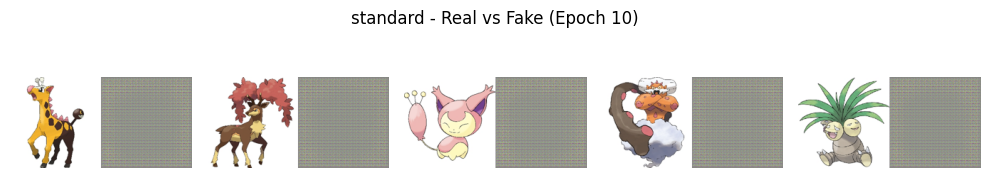

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
🔥 FID at Epoch 10: 423.04
Epoch 11 - G: 2.2939 | D: 0.1392
Epoch 12 - G: 2.9936 | D: 0.1360
Epoch 13 - G: 3.5555 | D: 0.0595
Epoch 14 - G: 3.1171 | D: 0.0537
Epoch 15 - G: 3.5900 | D: 0.0617
Epoch 16 - G: 2.7416 | D: 0.0945
Epoch 17 - G: 2.7544 | D: 0.2466
Epoch 18 - G: 5.5489 | D: 0.2504
Epoch 19 - G: 3.4138 | D: 0.2575
Epoch 20 - G: 4.8233 | D: 0.3281


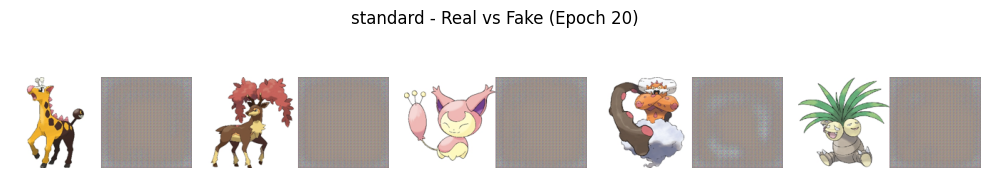

🔥 FID at Epoch 20: 422.17
Epoch 21 - G: 4.2529 | D: 0.0520
Epoch 22 - G: 2.1988 | D: 0.3090
Epoch 23 - G: 3.0829 | D: 0.1384
Epoch 24 - G: 3.1802 | D: 0.0580
Epoch 25 - G: 3.7863 | D: 0.0442
Epoch 26 - G: 3.2308 | D: 0.0951
Epoch 27 - G: 2.9429 | D: 0.3223
Epoch 28 - G: 2.1592 | D: 0.2086
Epoch 29 - G: 2.9604 | D: 0.1605
Epoch 30 - G: 3.4688 | D: 0.2618


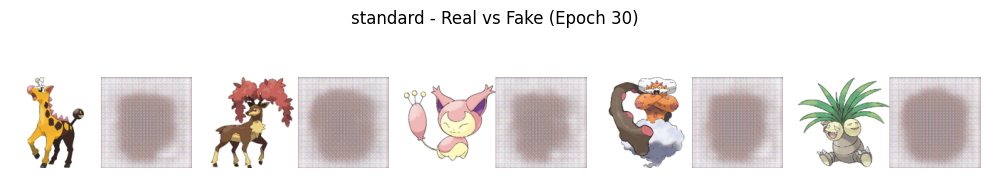

🔥 FID at Epoch 30: 389.65
Epoch 31 - G: 5.2033 | D: 0.0829
Epoch 32 - G: 1.9338 | D: 0.2963
Epoch 33 - G: 6.5463 | D: 0.1101
Epoch 34 - G: 7.8883 | D: 0.4046
Epoch 35 - G: 8.0896 | D: 0.1031
Epoch 36 - G: 7.0745 | D: 0.1310
Epoch 37 - G: 7.6192 | D: 0.4386
Epoch 38 - G: 7.1986 | D: 0.2062
Epoch 39 - G: 7.5997 | D: 0.4400
Epoch 40 - G: 1.3513 | D: 0.7807


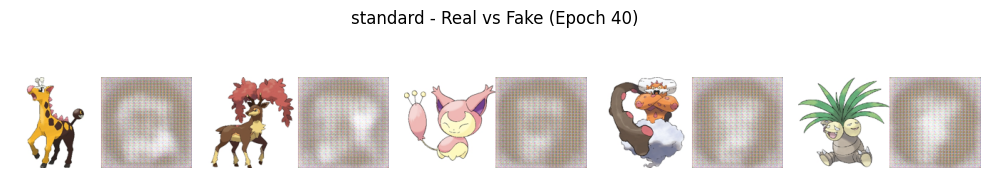

🔥 FID at Epoch 40: 384.18
Epoch 41 - G: 2.0523 | D: 0.2575
Epoch 42 - G: 2.4632 | D: 0.2818
Epoch 43 - G: 6.8923 | D: 1.4213
Epoch 44 - G: 1.9564 | D: 0.3411
Epoch 45 - G: 1.3255 | D: 0.5946
Epoch 46 - G: 2.4647 | D: 0.1957
Epoch 47 - G: 2.3860 | D: 0.4288
Epoch 48 - G: 3.2392 | D: 0.1085
Epoch 49 - G: 3.8727 | D: 0.1391
Epoch 50 - G: 2.7054 | D: 0.2017


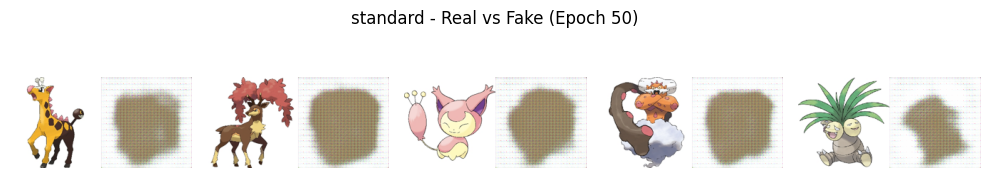

🔥 FID at Epoch 50: 328.71


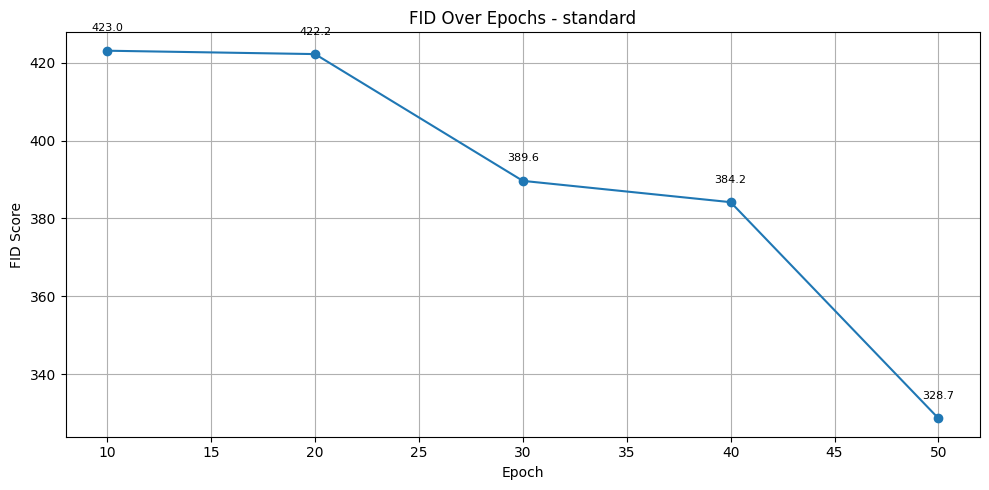

In [14]:
std_gen = make_generator()
std_disc = make_discriminator()
train_dcgan(std_gen, std_disc, train_images, "standard")

## Custom Model

Epoch 1 - G: 8.0388 | D: 0.0004
Epoch 2 - G: 8.0722 | D: 0.0004
Epoch 3 - G: 24.2783 | D: 0.0000
Epoch 4 - G: 17.7523 | D: 0.0751
Epoch 5 - G: 29.7706 | D: 0.3705
Epoch 6 - G: 3.4658 | D: 0.1125
Epoch 7 - G: 12.3356 | D: 0.0191
Epoch 8 - G: 6.2816 | D: 0.2475
Epoch 9 - G: 8.2012 | D: 0.0015
Epoch 10 - G: 7.0903 | D: 0.0083


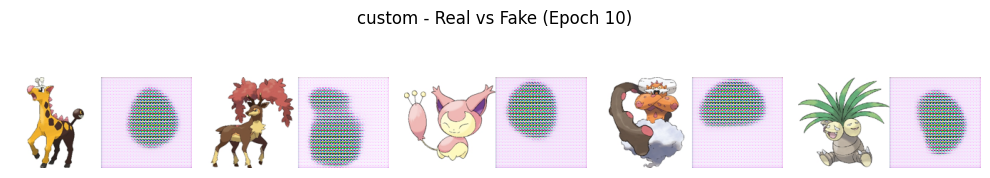

🔥 FID at Epoch 10: 433.60
Epoch 11 - G: 7.5288 | D: 0.0061
Epoch 12 - G: 8.9590 | D: 0.0088
Epoch 13 - G: 5.2675 | D: 0.0677
Epoch 14 - G: 1.5890 | D: 0.7311
Epoch 15 - G: 43.7872 | D: 0.2114
Epoch 16 - G: 18.6188 | D: 0.0001
Epoch 17 - G: 43.3433 | D: 0.3520
Epoch 18 - G: 6.5471 | D: 0.1135
Epoch 19 - G: 17.6490 | D: 0.0047
Epoch 20 - G: 18.8761 | D: 0.0050


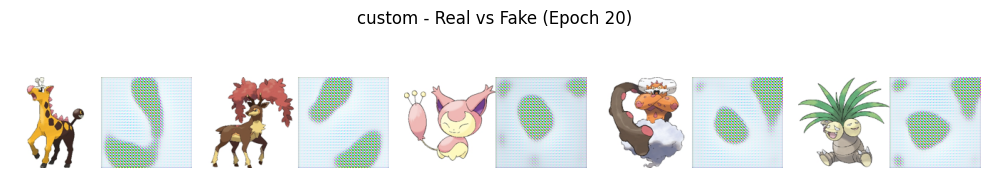

🔥 FID at Epoch 20: 430.97
Epoch 21 - G: 9.7633 | D: 0.0026
Epoch 22 - G: 10.2078 | D: 0.0011
Epoch 23 - G: 10.5493 | D: 0.0022
Epoch 24 - G: 11.8670 | D: 0.0065
Epoch 25 - G: 9.4799 | D: 0.0239
Epoch 26 - G: 6.0218 | D: 0.0282
Epoch 27 - G: 9.0789 | D: 0.1730
Epoch 28 - G: 9.2235 | D: 0.0380
Epoch 29 - G: 14.7708 | D: 0.0219
Epoch 30 - G: 8.1911 | D: 0.4022


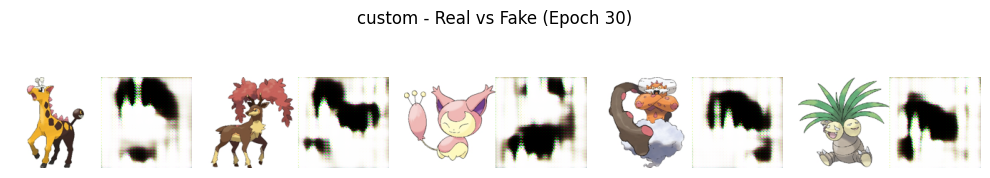

🔥 FID at Epoch 30: 386.33
Epoch 31 - G: 4.2043 | D: 0.4663
Epoch 32 - G: 3.8754 | D: 0.3225
Epoch 33 - G: 9.7677 | D: 0.0214
Epoch 34 - G: 5.4799 | D: 0.2918
Epoch 35 - G: 4.1524 | D: 0.2144
Epoch 36 - G: 5.1783 | D: 0.2829
Epoch 37 - G: 22.2231 | D: 0.0190
Epoch 38 - G: 6.2099 | D: 1.8910
Epoch 39 - G: 3.8695 | D: 0.0878
Epoch 40 - G: 3.0569 | D: 0.2340


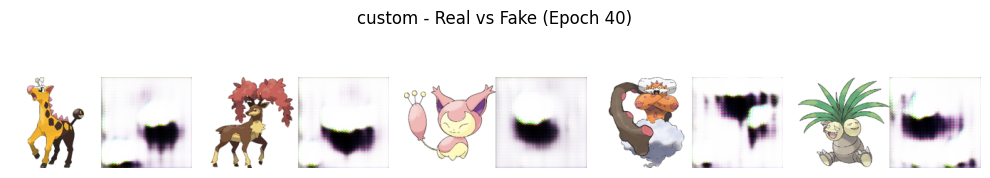

🔥 FID at Epoch 40: 311.11
Epoch 41 - G: 4.6803 | D: 0.2342
Epoch 42 - G: 2.5656 | D: 0.6792
Epoch 43 - G: 3.8143 | D: 0.2523
Epoch 44 - G: 6.1025 | D: 0.0428
Epoch 45 - G: 4.9457 | D: 0.0272
Epoch 46 - G: 3.6910 | D: 0.1146
Epoch 47 - G: 6.3197 | D: 0.3610
Epoch 48 - G: 9.4947 | D: 0.1147
Epoch 49 - G: 8.1005 | D: 0.1672
Epoch 50 - G: 6.8155 | D: 0.2622


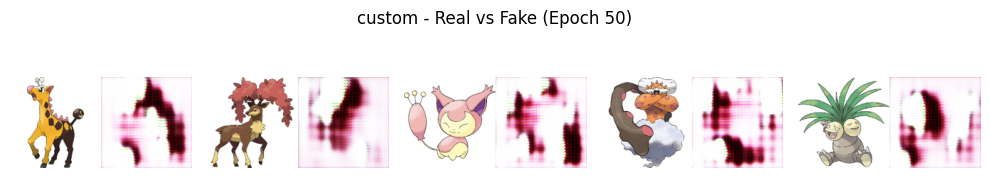

🔥 FID at Epoch 50: 355.06


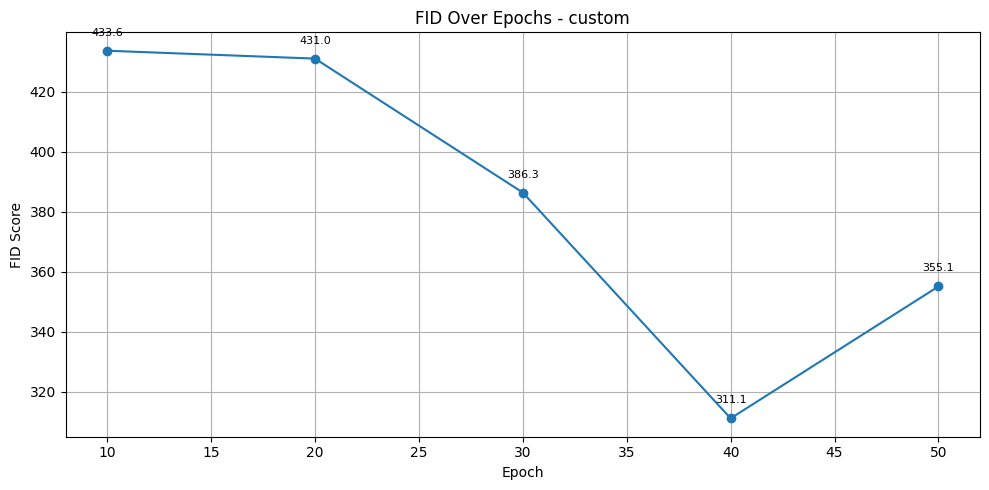

In [15]:
cus_gen = generator()
cus_disc = discriminator()
train_dcgan(cus_gen, cus_disc, train_images, "custom")

# GAN Evaluation (FID on train + test) - Before Hyperparameter Tuning

In [16]:
# Save real train/test images
REAL_TRAIN = os.path.join(SAVE_DIR, "fid_real_train")
REAL_TEST = os.path.join(SAVE_DIR, "fid_real_test")
os.makedirs(REAL_TRAIN, exist_ok=True)
os.makedirs(REAL_TEST, exist_ok=True)

num_samples = min(500, len(train_images), len(test_images))
for i in range(num_samples):
    train_img = (train_images[i] + 1) * 127.5
    test_img = (test_images[i] + 1) * 127.5
    Image.fromarray(train_img.astype(np.uint8)).save(f"{REAL_TRAIN}/{i:04d}.png")
    Image.fromarray(test_img.astype(np.uint8)).save(f"{REAL_TEST}/{i:04d}.png")

# Save fake images from both generators
FAKE_STD_TRAIN = os.path.join(SAVE_DIR, "fake_std_train")
FAKE_STD_TEST = os.path.join(SAVE_DIR, "fake_std_test")
generate_fid_images(std_gen, FAKE_STD_TRAIN)
generate_fid_images(std_gen, FAKE_STD_TEST)

FAKE_CUS_TRAIN = os.path.join(SAVE_DIR, "fake_cus_train")
FAKE_CUS_TEST = os.path.join(SAVE_DIR, "fake_cus_test")
generate_fid_images(cus_gen, FAKE_CUS_TRAIN)
generate_fid_images(cus_gen, FAKE_CUS_TEST)

# Calculate FID scores
fid_std_train = calculate_fid(REAL_TRAIN, FAKE_STD_TRAIN)
fid_std_test = calculate_fid(REAL_TEST, FAKE_STD_TEST)
fid_cus_train = calculate_fid(REAL_TRAIN, FAKE_CUS_TRAIN)
fid_cus_test = calculate_fid(REAL_TEST, FAKE_CUS_TEST)

# ----------- Real-vs-Fake Classifier Accuracy --------------

# For standard GAN
Xtr_std, Xte_std, ytr_std, yte_std = load_classifier_data(std_gen, train_images)
clf_std = build_classifier()
clf_std.fit(Xtr_std, ytr_std, epochs=5, batch_size=64, verbose=0)
acc_std_train = clf_std.evaluate(Xtr_std, ytr_std, verbose=0)[1]
acc_std_test = clf_std.evaluate(Xte_std, yte_std, verbose=0)[1]

# For custom GAN
Xtr_cus, Xte_cus, ytr_cus, yte_cus = load_classifier_data(cus_gen, train_images)
clf_cus = build_classifier()
clf_cus.fit(Xtr_cus, ytr_cus, epochs=5, batch_size=64, verbose=0)
acc_cus_train = clf_cus.evaluate(Xtr_cus, ytr_cus, verbose=0)[1]
acc_cus_test = clf_cus.evaluate(Xte_cus, yte_cus, verbose=0)[1]

# --------------- Print Final Evaluation Summary ----------------

print("\n📊 Evaluation BEFORE Hyperparameter Tuning\n")
print("➡️ Standard DCGAN")
print(f"   FID (Train): {fid_std_train:.2f} | FID (Test): {fid_std_test:.2f}")
print(f"   Classifier Accuracy (Train): {acc_std_train:.2%} | (Test): {acc_std_test:.2%}")

print("\n➡️ Custom DCGAN")
print(f"   FID (Train): {fid_cus_train:.2f} | FID (Test): {fid_cus_test:.2f}")
print(f"   Classifier Accuracy (Train): {acc_cus_train:.2%} | (Test): {acc_cus_test:.2%}")

✅ Final shape: X=(1310, 128, 128, 3), y=(1310,)
✅ Final shape: X=(1310, 128, 128, 3), y=(1310,)

📊 Evaluation BEFORE Hyperparameter Tuning

➡️ Standard DCGAN
   FID (Train): 333.25 | FID (Test): 341.62
   Classifier Accuracy (Train): 0.00% | (Test): 0.00%

➡️ Custom DCGAN
   FID (Train): 356.39 | FID (Test): 363.56
   Classifier Accuracy (Train): 0.00% | (Test): 0.00%


# Hyperparameter Tuning

## Custom DCGAN Tuning

🚀 Starting Hyperparameter Tuning for Custom DCGAN...

🔍 Custom GAN Combo: LR=0.0001, Dropout=0.2, Batch=64
Epoch 1 - G: 5.9111 | D: 0.0031
Epoch 2 - G: 0.7592 | D: 0.6709
Epoch 3 - G: 7.6910 | D: 0.0005
Epoch 4 - G: 5.9062 | D: 0.0032
Epoch 5 - G: 8.6897 | D: 0.0003
Epoch 6 - G: 8.4852 | D: 0.0070
Epoch 7 - G: 10.6454 | D: 0.1921
Epoch 8 - G: 15.6471 | D: 0.0000
Epoch 9 - G: 0.7245 | D: 2.3042
Epoch 10 - G: 43.8202 | D: 0.0205


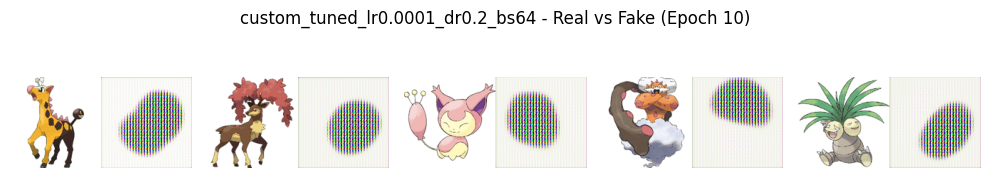

🔥 FID at Epoch 10: 348.90
Epoch 11 - G: 14.8525 | D: 0.0758
Epoch 12 - G: 20.0235 | D: 0.0032
Epoch 13 - G: 36.9169 | D: 0.0013
Epoch 14 - G: 15.4429 | D: 0.0332
Epoch 15 - G: 16.1757 | D: 0.0140
Epoch 16 - G: 15.7873 | D: 0.0483
Epoch 17 - G: 10.4465 | D: 0.0044
Epoch 18 - G: 9.6850 | D: 0.0369
Epoch 19 - G: 6.0645 | D: 0.0159
Epoch 20 - G: 5.2710 | D: 0.0800


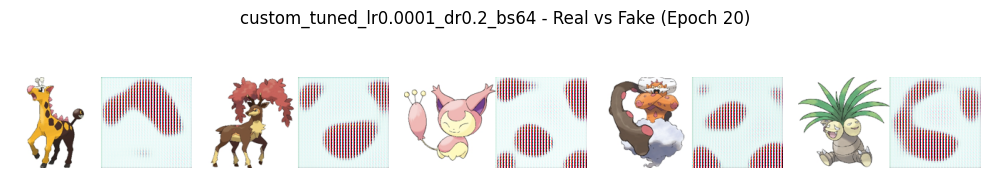

🔥 FID at Epoch 20: 393.27
Epoch 21 - G: 18.8261 | D: 0.0005
Epoch 22 - G: 19.7606 | D: 0.0551
Epoch 23 - G: 22.1526 | D: 0.0003
Epoch 24 - G: 11.0292 | D: 0.0006
Epoch 25 - G: 11.6076 | D: 0.0402
Epoch 26 - G: 10.5771 | D: 0.0206
Epoch 27 - G: 12.3795 | D: 0.0221
Epoch 28 - G: 8.0246 | D: 0.1629
Epoch 29 - G: 14.7952 | D: 0.6721
Epoch 30 - G: 12.0376 | D: 1.2056


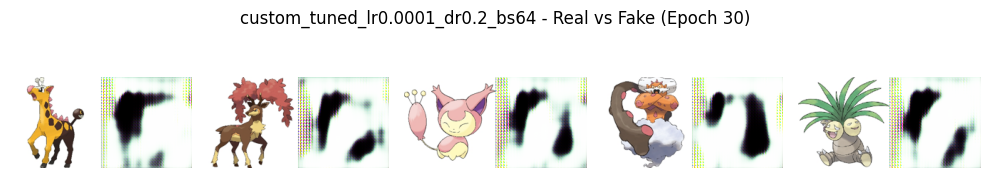

🔥 FID at Epoch 30: 391.11


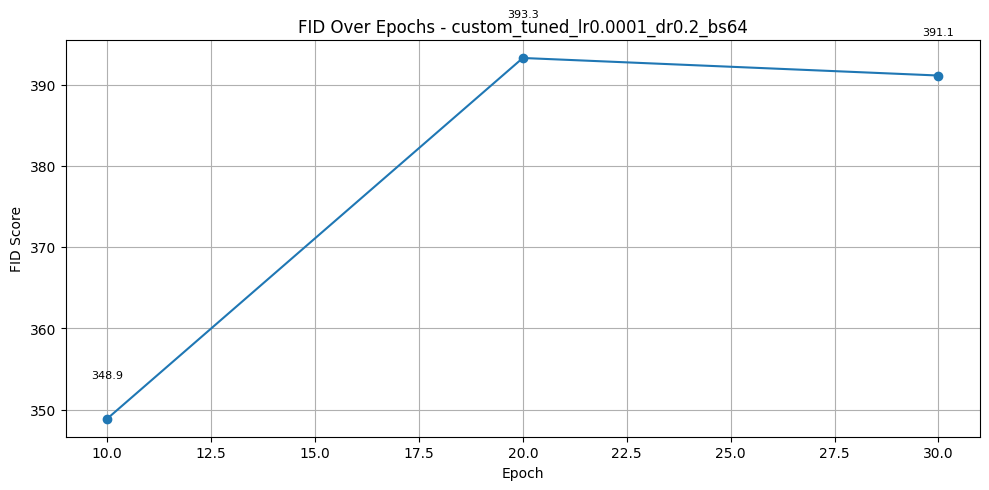

🎯 FID (Custom, Test): 405.52
🔍 Custom GAN Combo: LR=0.0001, Dropout=0.2, Batch=128
Epoch 1 - G: 2.9855 | D: 0.1109
Epoch 2 - G: 5.2206 | D: 0.0315
Epoch 3 - G: 3.4991 | D: 0.0334
Epoch 4 - G: 6.6815 | D: 0.0014
Epoch 5 - G: 6.7708 | D: 0.0013
Epoch 6 - G: 4.3344 | D: 0.0168
Epoch 7 - G: 2.5532 | D: 0.1321
Epoch 8 - G: 7.2749 | D: 0.4267
Epoch 9 - G: 5.6685 | D: 0.0816
Epoch 10 - G: 7.3862 | D: 0.0083


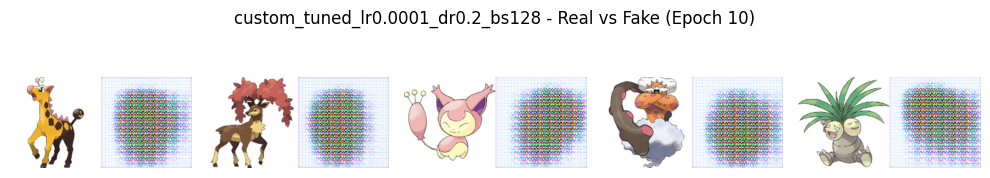

🔥 FID at Epoch 10: 408.23
Epoch 11 - G: 13.1446 | D: 0.8106
Epoch 12 - G: 27.7710 | D: 0.0000
Epoch 13 - G: 13.1167 | D: 0.0005
Epoch 14 - G: 21.0010 | D: 0.0000
Epoch 15 - G: 12.7038 | D: 0.0010
Epoch 16 - G: 4.9937 | D: 0.0394
Epoch 17 - G: 22.9933 | D: 0.0001
Epoch 18 - G: 14.7250 | D: 0.0135
Epoch 19 - G: 17.9965 | D: 0.0313
Epoch 20 - G: 24.6622 | D: 0.0119


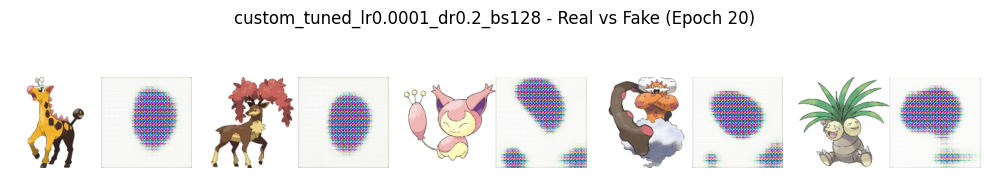

🔥 FID at Epoch 20: 370.68
Epoch 21 - G: 10.4020 | D: 0.0673
Epoch 22 - G: 7.3193 | D: 0.0684
Epoch 23 - G: 7.8140 | D: 0.0181
Epoch 24 - G: 16.0611 | D: 0.0507
Epoch 25 - G: 9.8502 | D: 0.0170
Epoch 26 - G: 8.3912 | D: 0.0246
Epoch 27 - G: 9.9524 | D: 0.0103
Epoch 28 - G: 22.7952 | D: 0.0332
Epoch 29 - G: 35.0390 | D: 0.2727
Epoch 30 - G: 47.5209 | D: 0.0005


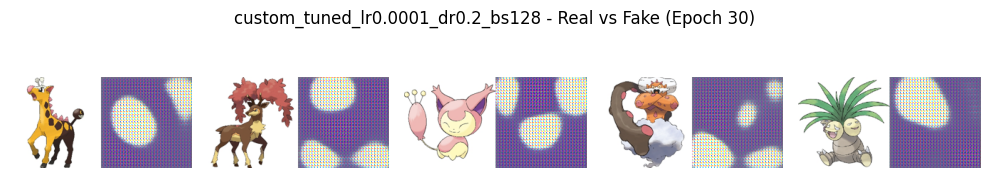

🔥 FID at Epoch 30: 451.33


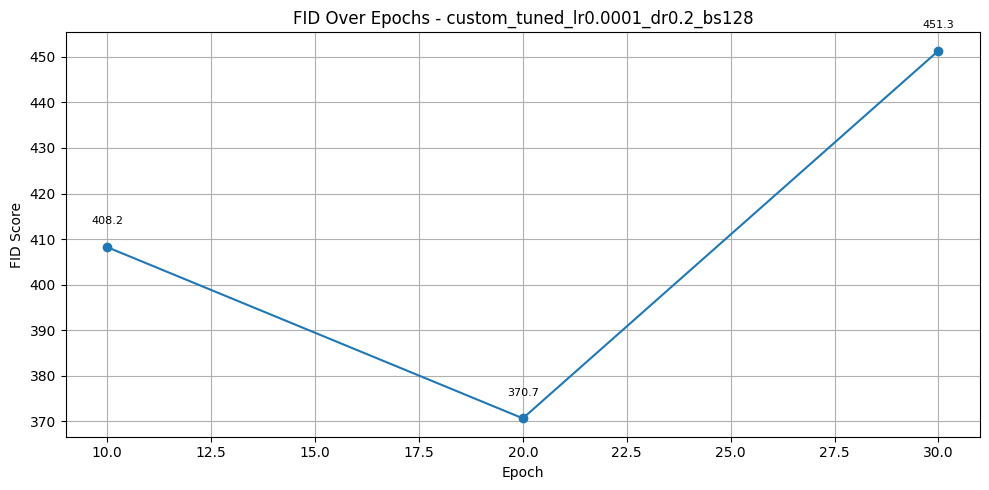

🎯 FID (Custom, Test): 458.10
🔍 Custom GAN Combo: LR=0.0001, Dropout=0.3, Batch=64
Epoch 1 - G: 4.9844 | D: 0.1183
Epoch 2 - G: 3.1370 | D: 0.0631
Epoch 3 - G: 7.9678 | D: 0.2854
Epoch 4 - G: 22.1758 | D: 0.3697
Epoch 5 - G: 9.6271 | D: 0.0039
Epoch 6 - G: 6.0884 | D: 0.0427
Epoch 7 - G: 6.2961 | D: 0.0198
Epoch 8 - G: 12.2226 | D: 0.1036
Epoch 9 - G: 11.3390 | D: 0.0743
Epoch 10 - G: 7.0086 | D: 0.0105


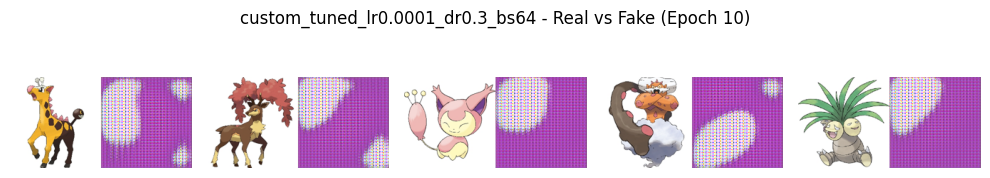

🔥 FID at Epoch 10: 376.56
Epoch 11 - G: 3.7265 | D: 0.0632
Epoch 12 - G: 7.9225 | D: 0.0223
Epoch 13 - G: 13.5817 | D: 0.0023
Epoch 14 - G: 8.0037 | D: 0.0070
Epoch 15 - G: 8.5111 | D: 0.0031
Epoch 16 - G: 8.6893 | D: 0.0070
Epoch 17 - G: 6.9856 | D: 0.0087
Epoch 18 - G: 12.7693 | D: 0.2471
Epoch 19 - G: 5.8949 | D: 0.0061
Epoch 20 - G: 8.0292 | D: 0.0026


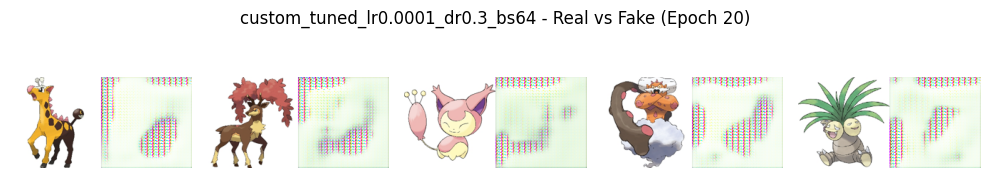

🔥 FID at Epoch 20: 435.67
Epoch 21 - G: 17.4128 | D: 1.5390
Epoch 22 - G: 10.5024 | D: 0.2439
Epoch 23 - G: 5.8684 | D: 0.0339
Epoch 24 - G: 8.2863 | D: 0.1032
Epoch 25 - G: 8.1267 | D: 0.1272
Epoch 26 - G: 16.5471 | D: 0.7352
Epoch 27 - G: 9.9864 | D: 0.0072
Epoch 28 - G: 7.8766 | D: 0.0166
Epoch 29 - G: 9.3410 | D: 0.0028
Epoch 30 - G: 4.9047 | D: 0.0758


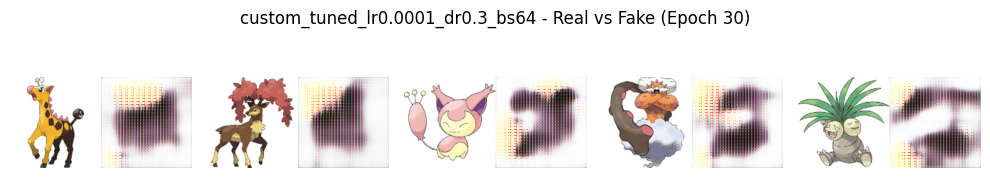

🔥 FID at Epoch 30: 329.65


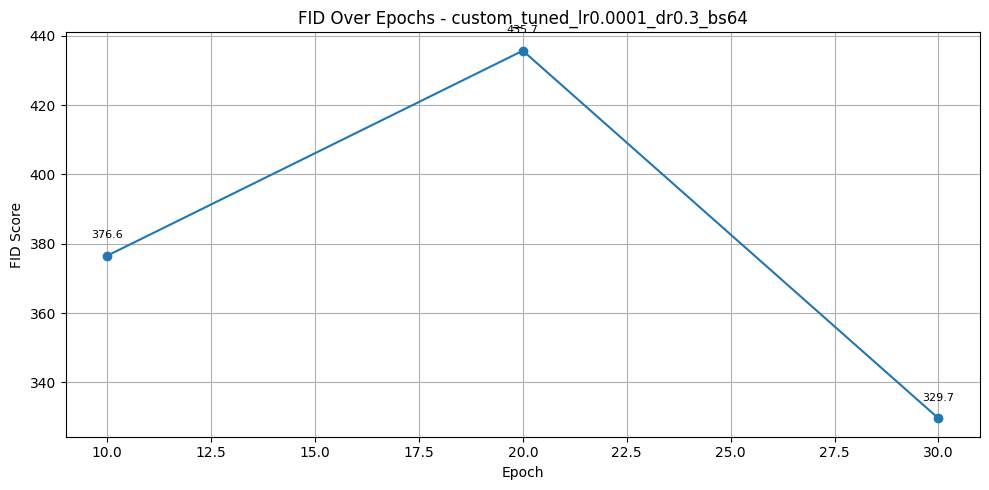

🎯 FID (Custom, Test): 341.83
🔍 Custom GAN Combo: LR=0.0001, Dropout=0.3, Batch=128
Epoch 1 - G: 3.6548 | D: 0.0744
Epoch 2 - G: 9.6898 | D: 0.0001
Epoch 3 - G: 8.4642 | D: 0.0003
Epoch 4 - G: 8.9693 | D: 0.0003
Epoch 5 - G: 3.0587 | D: 0.1250
Epoch 6 - G: 36.9947 | D: 0.4708
Epoch 7 - G: 22.9914 | D: 0.3897
Epoch 8 - G: 23.0706 | D: 0.0014
Epoch 9 - G: 24.7297 | D: 0.0000
Epoch 10 - G: 11.7007 | D: 0.0000


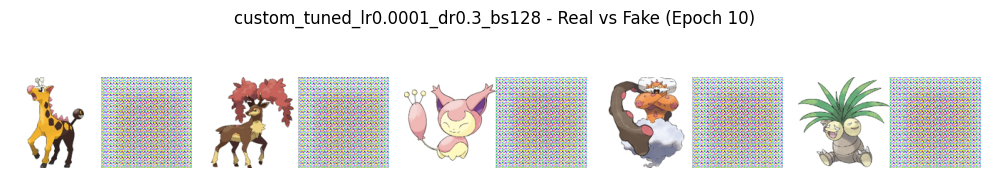

🔥 FID at Epoch 10: 409.58
Epoch 11 - G: 45.0175 | D: 0.0021
Epoch 12 - G: 34.4383 | D: 0.1046
Epoch 13 - G: 5.6556 | D: 0.0077
Epoch 14 - G: 6.6034 | D: 0.0583
Epoch 15 - G: 2.3619 | D: 0.2546
Epoch 16 - G: 8.9874 | D: 0.0062
Epoch 17 - G: 6.2278 | D: 0.0960
Epoch 18 - G: 5.9201 | D: 0.2511
Epoch 19 - G: 7.3418 | D: 0.6310
Epoch 20 - G: 12.3005 | D: 0.5157


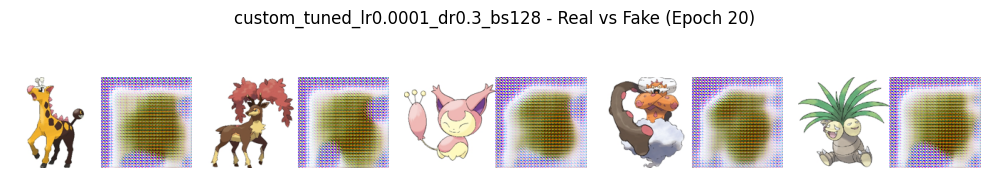

🔥 FID at Epoch 20: 492.17
Epoch 21 - G: 13.5689 | D: 0.1041
Epoch 22 - G: 13.5987 | D: 0.0046
Epoch 23 - G: 4.4044 | D: 0.3313
Epoch 24 - G: 9.1567 | D: 0.3009
Epoch 25 - G: 12.3615 | D: 0.0322
Epoch 26 - G: 7.9183 | D: 0.0681
Epoch 27 - G: 11.7339 | D: 0.0286
Epoch 28 - G: 10.1383 | D: 0.0009
Epoch 29 - G: 10.7376 | D: 0.0022
Epoch 30 - G: 7.4663 | D: 0.0105


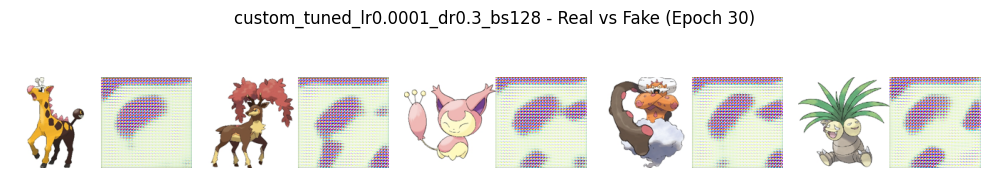

🔥 FID at Epoch 30: 446.88


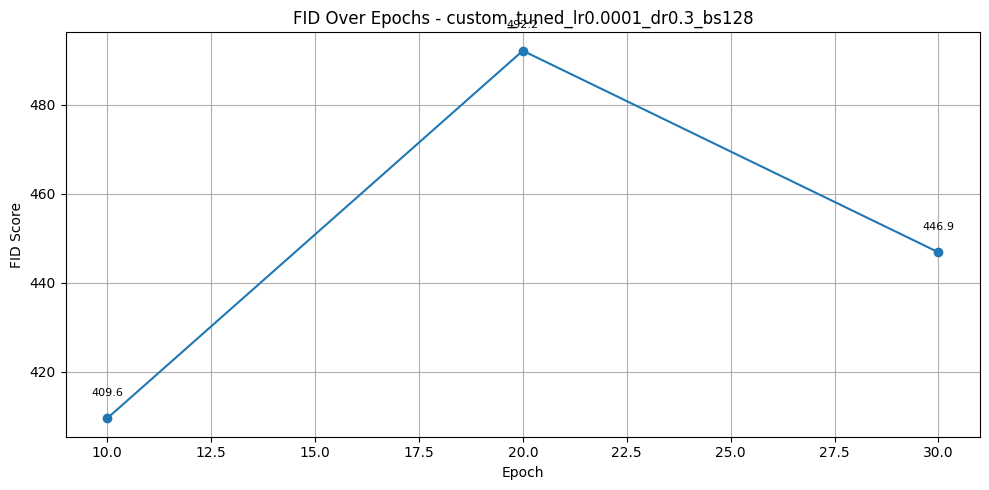

🎯 FID (Custom, Test): 457.19
🔍 Custom GAN Combo: LR=0.0002, Dropout=0.2, Batch=64
Epoch 1 - G: 5.1215 | D: 0.0065
Epoch 2 - G: 28.3674 | D: 0.0000
Epoch 3 - G: 28.3236 | D: 0.0000
Epoch 4 - G: 35.7910 | D: 0.0000
Epoch 5 - G: 23.5239 | D: 0.0000
Epoch 6 - G: 39.2781 | D: 0.0000
Epoch 7 - G: 19.9948 | D: 0.0009
Epoch 8 - G: 14.6086 | D: 0.0036
Epoch 9 - G: 11.8472 | D: 0.2028
Epoch 10 - G: 20.1825 | D: 0.0115


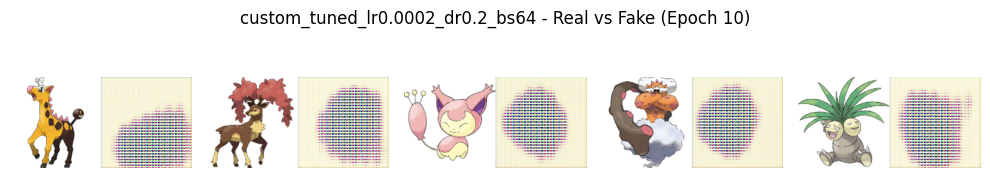

🔥 FID at Epoch 10: 389.57
Epoch 11 - G: 23.0465 | D: 0.0000
Epoch 12 - G: 8.2429 | D: 0.1248
Epoch 13 - G: 10.6064 | D: 0.0235
Epoch 14 - G: 21.3580 | D: 0.0030
Epoch 15 - G: 24.1138 | D: 0.0004
Epoch 16 - G: 12.8763 | D: 0.0303
Epoch 17 - G: 41.7955 | D: 0.0008
Epoch 18 - G: 22.3393 | D: 0.0064
Epoch 19 - G: 32.3607 | D: 0.0000
Epoch 20 - G: 17.3757 | D: 0.1256


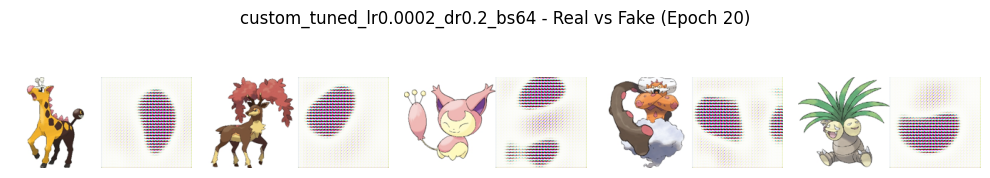

🔥 FID at Epoch 20: 386.10
Epoch 21 - G: 16.6074 | D: 0.9221
Epoch 22 - G: 10.5795 | D: 0.0854
Epoch 23 - G: 10.8617 | D: 0.0400
Epoch 24 - G: 7.6648 | D: 0.1059
Epoch 25 - G: 12.0868 | D: 0.1051
Epoch 26 - G: 9.4104 | D: 0.0764
Epoch 27 - G: 10.7569 | D: 0.0672
Epoch 28 - G: 8.4187 | D: 0.2592
Epoch 29 - G: 7.7309 | D: 0.0135
Epoch 30 - G: 4.0084 | D: 0.3115


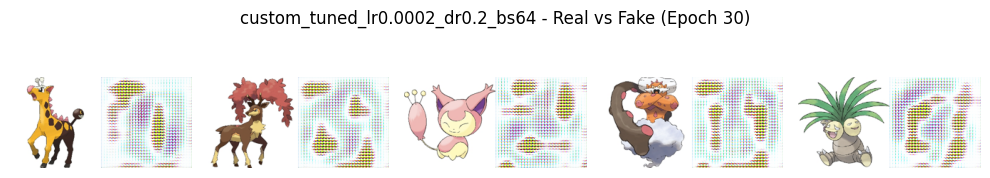

🔥 FID at Epoch 30: 369.43


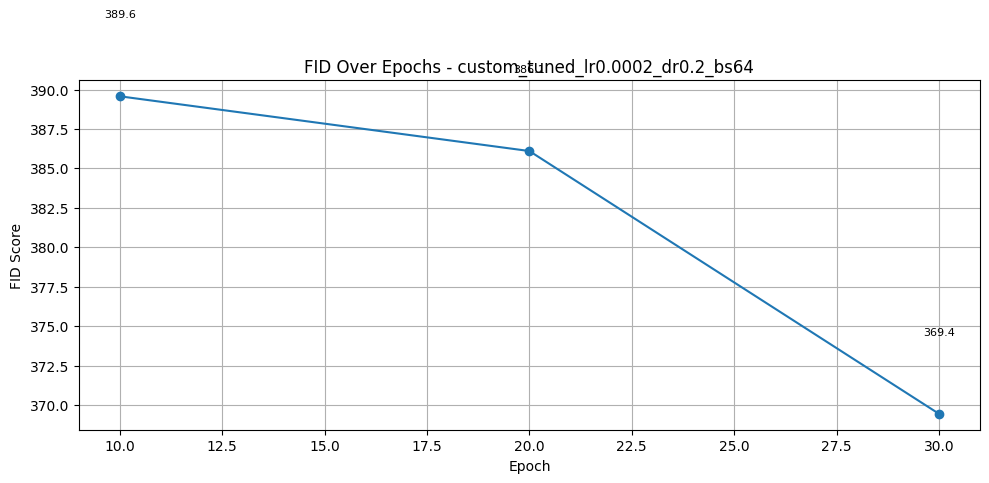

🎯 FID (Custom, Test): 381.82
🔍 Custom GAN Combo: LR=0.0002, Dropout=0.2, Batch=128
Epoch 1 - G: 1.3979 | D: 0.3710
Epoch 2 - G: 4.6468 | D: 0.0132
Epoch 3 - G: 7.1567 | D: 0.2504
Epoch 4 - G: 6.8865 | D: 0.0013
Epoch 5 - G: 15.6400 | D: 0.0701
Epoch 6 - G: 21.4082 | D: 0.0000
Epoch 7 - G: 25.1746 | D: 0.0089
Epoch 8 - G: 7.3540 | D: 0.0012
Epoch 9 - G: 5.8290 | D: 0.0174
Epoch 10 - G: 12.2678 | D: 0.0010


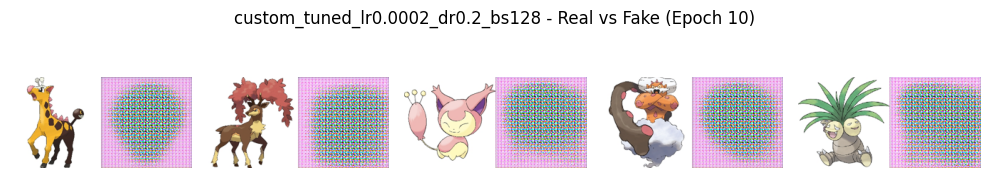

🔥 FID at Epoch 10: 486.13
Epoch 11 - G: 11.8023 | D: 0.0002
Epoch 12 - G: 5.9369 | D: 0.0129
Epoch 13 - G: 5.1987 | D: 0.0215
Epoch 14 - G: 6.8226 | D: 0.0740
Epoch 15 - G: 4.0993 | D: 0.1947
Epoch 16 - G: 29.1069 | D: 0.0000
Epoch 17 - G: 13.8302 | D: 0.0003
Epoch 18 - G: 8.8080 | D: 0.0498
Epoch 19 - G: 5.6815 | D: 0.0641
Epoch 20 - G: 11.7844 | D: 0.0051


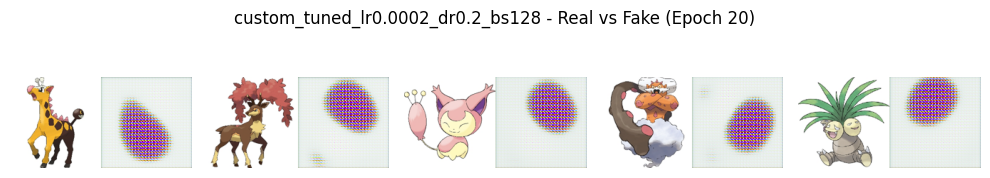

🔥 FID at Epoch 20: 421.69
Epoch 21 - G: 10.8525 | D: 0.0052
Epoch 22 - G: 15.2695 | D: 0.0005
Epoch 23 - G: 17.5045 | D: 0.0001
Epoch 24 - G: 11.5631 | D: 0.0040
Epoch 25 - G: 12.8156 | D: 0.0012
Epoch 26 - G: 8.6592 | D: 0.0408
Epoch 27 - G: 10.6675 | D: 0.0173
Epoch 28 - G: 15.2629 | D: 0.0007
Epoch 29 - G: 13.0793 | D: 0.0053
Epoch 30 - G: 15.6199 | D: 0.0257


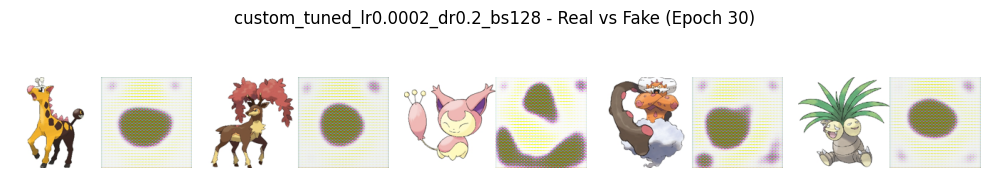

🔥 FID at Epoch 30: 333.65


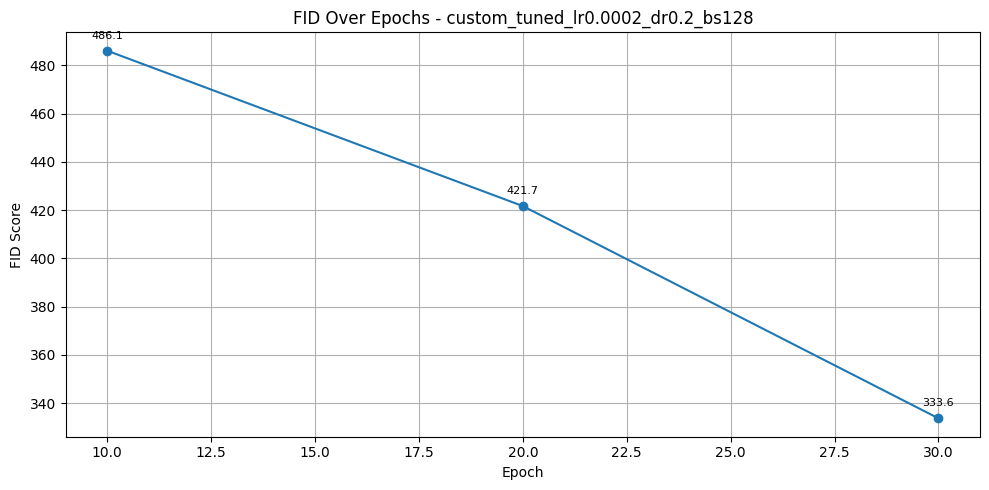

🎯 FID (Custom, Test): 345.34
🔍 Custom GAN Combo: LR=0.0002, Dropout=0.3, Batch=64
Epoch 1 - G: 5.7052 | D: 0.0040
Epoch 2 - G: 0.4863 | D: 1.0639
Epoch 3 - G: 6.5112 | D: 0.0016
Epoch 4 - G: 6.3407 | D: 0.0026
Epoch 5 - G: 5.3445 | D: 1.2487
Epoch 6 - G: 5.5339 | D: 0.2556
Epoch 7 - G: 6.4081 | D: 0.0021
Epoch 8 - G: 3.1538 | D: 0.0657
Epoch 9 - G: 5.2863 | D: 0.1074
Epoch 10 - G: 4.4949 | D: 0.0170


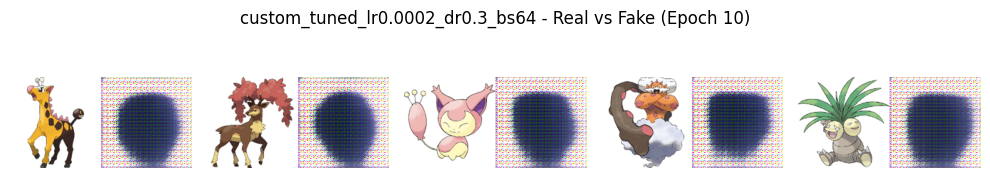

🔥 FID at Epoch 10: 420.53
Epoch 11 - G: 3.6364 | D: 0.0482
Epoch 12 - G: 3.0700 | D: 0.4688
Epoch 13 - G: 3.1375 | D: 0.1518
Epoch 14 - G: 5.1286 | D: 0.0695
Epoch 15 - G: 11.1682 | D: 2.8853
Epoch 16 - G: 3.6440 | D: 0.2399
Epoch 17 - G: 2.2238 | D: 0.2850
Epoch 18 - G: 3.9676 | D: 0.1983
Epoch 19 - G: 4.8769 | D: 0.1203
Epoch 20 - G: 5.6026 | D: 0.1181


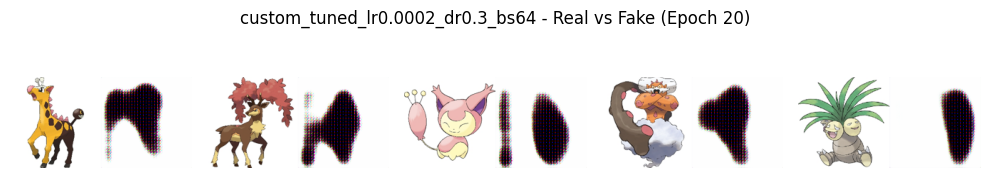

🔥 FID at Epoch 20: 294.26
Epoch 21 - G: 3.5763 | D: 0.3332
Epoch 22 - G: 9.8046 | D: 0.2857
Epoch 23 - G: 6.8846 | D: 0.2457
Epoch 24 - G: 12.6059 | D: 0.1225
Epoch 25 - G: 4.2731 | D: 0.1363
Epoch 26 - G: 14.2858 | D: 0.3183
Epoch 27 - G: 11.1930 | D: 0.0247
Epoch 28 - G: 5.5266 | D: 0.5964
Epoch 29 - G: 13.4289 | D: 0.0675
Epoch 30 - G: 5.2411 | D: 0.0840


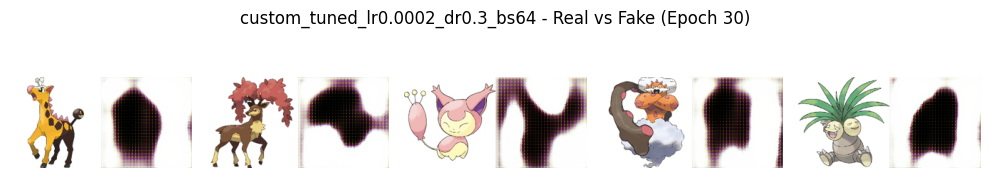

🔥 FID at Epoch 30: 391.54


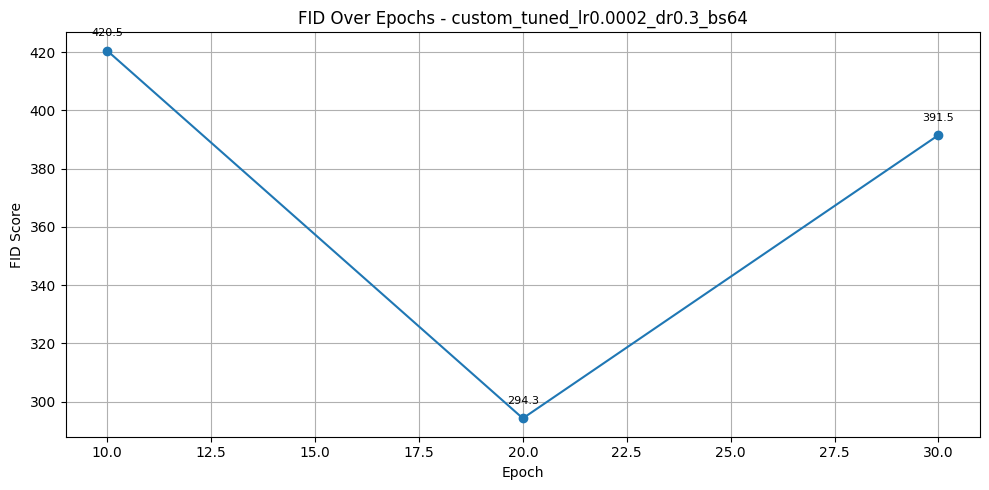

🎯 FID (Custom, Test): 406.04
🔍 Custom GAN Combo: LR=0.0002, Dropout=0.3, Batch=128
Epoch 1 - G: 3.5701 | D: 0.1291
Epoch 2 - G: 4.8235 | D: 0.0097
Epoch 3 - G: 23.7091 | D: 0.6841
Epoch 4 - G: 2.2435 | D: 0.1896
Epoch 5 - G: 8.8940 | D: 0.0002
Epoch 6 - G: 8.9022 | D: 0.0002
Epoch 7 - G: 5.1241 | D: 0.0081
Epoch 8 - G: 9.0132 | D: 0.0002
Epoch 9 - G: 5.6836 | D: 0.0046
Epoch 10 - G: 11.6869 | D: 0.0000


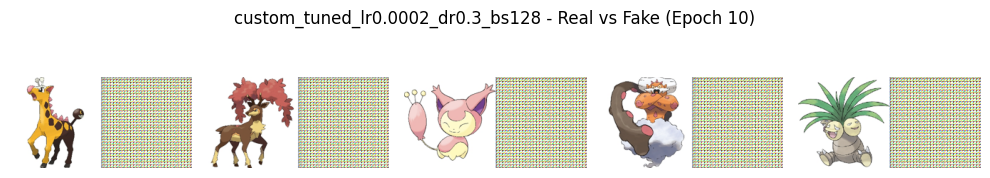

🔥 FID at Epoch 10: 416.89
Epoch 11 - G: 29.6176 | D: 0.0766
Epoch 12 - G: 19.8360 | D: 0.0000
Epoch 13 - G: 7.4402 | D: 0.0008
Epoch 14 - G: 3.8599 | D: 0.0327
Epoch 15 - G: 5.6516 | D: 0.0068
Epoch 16 - G: 6.9510 | D: 0.0201
Epoch 17 - G: 32.1362 | D: 0.0001
Epoch 18 - G: 15.0325 | D: 0.2725
Epoch 19 - G: 31.4498 | D: 0.1500
Epoch 20 - G: 0.3094 | D: 3.2452


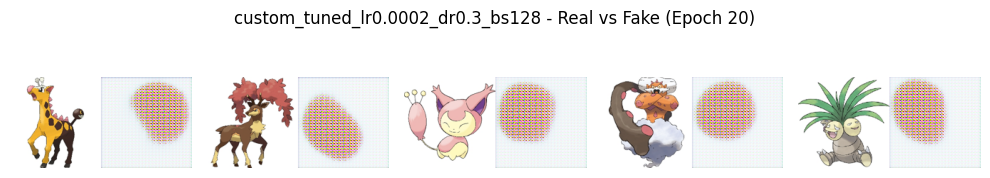

🔥 FID at Epoch 20: 394.04
Epoch 21 - G: 43.5936 | D: 0.4516
Epoch 22 - G: 25.3841 | D: 0.0000
Epoch 23 - G: 11.0174 | D: 0.0645
Epoch 24 - G: 12.4608 | D: 0.0067
Epoch 25 - G: 20.0473 | D: 0.0008
Epoch 26 - G: 3.6630 | D: 0.1043
Epoch 27 - G: 3.6714 | D: 0.1092
Epoch 28 - G: 12.8630 | D: 0.0437
Epoch 29 - G: 13.2929 | D: 0.0012
Epoch 30 - G: 7.0084 | D: 0.0058


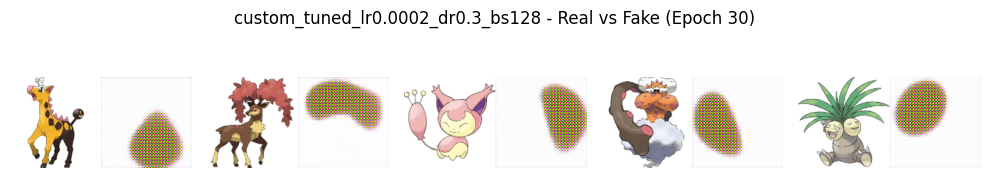

🔥 FID at Epoch 30: 317.56


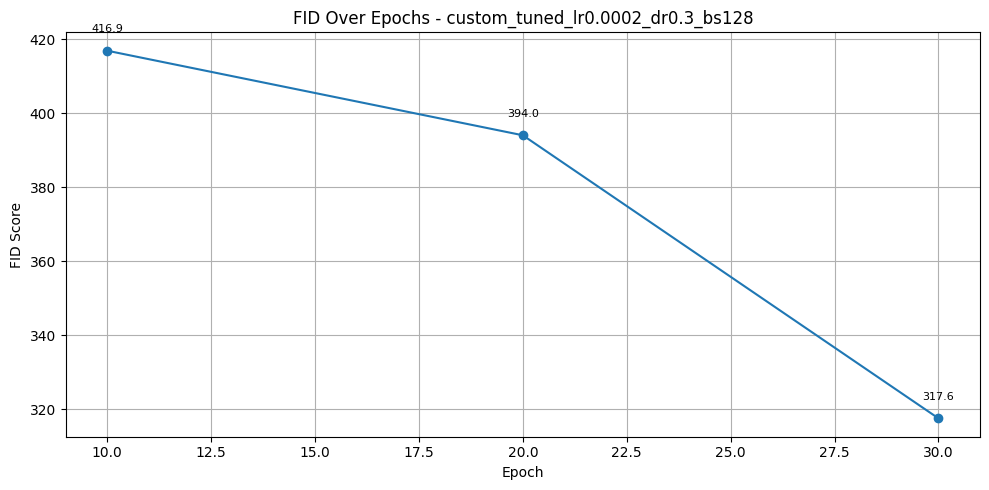

🎯 FID (Custom, Test): 329.43

🏆 Best Custom DCGAN Params:
LR: 0.0002, Dropout: 0.3, Batch: 128
Best FID: 329.43


In [17]:
from itertools import product

# Define hyperparameter grid
learning_rates = [1e-4, 2e-4]
dropout_rates = [0.2, 0.3]
batch_sizes = [64, 128]
param_combos = list(product(learning_rates, dropout_rates, batch_sizes))

# Track best custom DCGAN
best_fid_cus = float("inf")
best_combo_cus = None
best_model_cus = None

# Track best standard DCGAN
best_fid_std = float("inf")
best_combo_std = None
best_model_std = None

# Store original values
original_epochs = EPOCHS
original_batch_size = BATCH_SIZE
EPOCHS = 30  # Reduce for tuning

print("🚀 Starting Hyperparameter Tuning for Custom DCGAN...\n")

for lr, dropout, bsz in param_combos:
    print(f"🔍 Custom GAN Combo: LR={lr}, Dropout={dropout}, Batch={bsz}")
    BATCH_SIZE = bsz

    # Generator
    def tuned_generator():
        inputs = tf.keras.Input(shape=(LATENT_DIM,))
        x = layers.Dense(8 * 8 * 1024)(inputs)
        x = layers.Reshape((8, 8, 1024))(x)
        x = layers.LeakyReLU()(x)
        for filters in [512, 256, 128, 64]:
            x = layers.Conv2DTranspose(filters, 5, strides=2, padding='same')(x)
            x = InstanceNormalization()(x)
            x = layers.LeakyReLU()(x)
            x = layers.Dropout(dropout)(x)
        x = layers.Conv2DTranspose(3, 5, strides=1, padding='same', activation='tanh')(x)
        return tf.keras.Model(inputs, x)

    def tuned_discriminator():
        inputs = tf.keras.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
        x = inputs
        for filters, strides in zip([64, 128, 256, 512, 1024], [2, 2, 2, 1, 2]):
            x = layers.Conv2D(filters, 5, strides=strides, padding='same')(x)
            x = layers.LeakyReLU()(x)
            x = layers.Dropout(dropout)(x)
        x = layers.Flatten()(x)
        x = layers.Dense(1, activation='sigmoid')(x)
        return tf.keras.Model(inputs, x)

    custom_gen = tuned_generator()
    custom_disc = tuned_discriminator()

    train_dcgan(custom_gen, custom_disc, train_images, f"custom_tuned_lr{lr}_dr{dropout}_bs{bsz}")
    fake_path = os.path.join(SAVE_DIR, f"fid_custom_tuned_lr{lr}_dr{dropout}_bs{bsz}")
    fid = calculate_fid(os.path.join(SAVE_DIR, "fid_real_test"), fake_path)

    print(f"🎯 FID (Custom, Test): {fid:.2f}")
    if fid < best_fid_cus:
        best_fid_cus = fid
        best_combo_cus = (lr, dropout, bsz)
        best_model_cus = custom_gen

print("\n🏆 Best Custom DCGAN Params:")
print(f"LR: {best_combo_cus[0]}, Dropout: {best_combo_cus[1]}, Batch: {best_combo_cus[2]}")
print(f"Best FID: {best_fid_cus:.2f}")

## Standard DCGAN Tuning


🚀 Starting Hyperparameter Tuning for Standard DCGAN...

🔍 Standard GAN Combo: LR=0.0001, Dropout=0.2, Batch=64
Epoch 1 - G: 1.3348 | D: 0.3249
Epoch 2 - G: 4.5460 | D: 0.0370
Epoch 3 - G: 3.2890 | D: 0.0407
Epoch 4 - G: 4.4123 | D: 0.0123
Epoch 5 - G: 3.7988 | D: 0.0229
Epoch 6 - G: 4.1225 | D: 0.0262
Epoch 7 - G: 4.3698 | D: 0.0130
Epoch 8 - G: 6.3152 | D: 0.0276
Epoch 9 - G: 3.4223 | D: 0.0361
Epoch 10 - G: 2.6326 | D: 0.0837


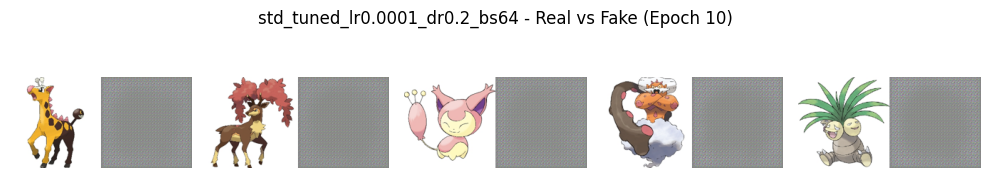

🔥 FID at Epoch 10: 427.59
Epoch 11 - G: 2.1128 | D: 0.1822
Epoch 12 - G: 3.8964 | D: 0.0754
Epoch 13 - G: 2.7223 | D: 0.0766
Epoch 14 - G: 2.5076 | D: 0.5083
Epoch 15 - G: 4.4049 | D: 0.0129
Epoch 16 - G: 4.2358 | D: 0.0352
Epoch 17 - G: 3.5759 | D: 0.2678
Epoch 18 - G: 5.4588 | D: 0.0133
Epoch 19 - G: 3.3709 | D: 0.0560
Epoch 20 - G: 4.5323 | D: 0.0418


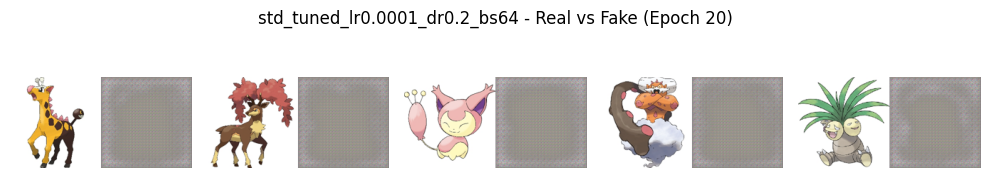

🔥 FID at Epoch 20: 525.51
Epoch 21 - G: 3.6508 | D: 0.1810
Epoch 22 - G: 1.6087 | D: 0.2721
Epoch 23 - G: 5.6160 | D: 0.1125
Epoch 24 - G: 4.2348 | D: 0.0649
Epoch 25 - G: 3.5813 | D: 0.0508
Epoch 26 - G: 6.0161 | D: 0.2155
Epoch 27 - G: 5.9648 | D: 0.0189
Epoch 28 - G: 7.0385 | D: 0.1398
Epoch 29 - G: 7.4775 | D: 0.1324
Epoch 30 - G: 11.0701 | D: 0.3415


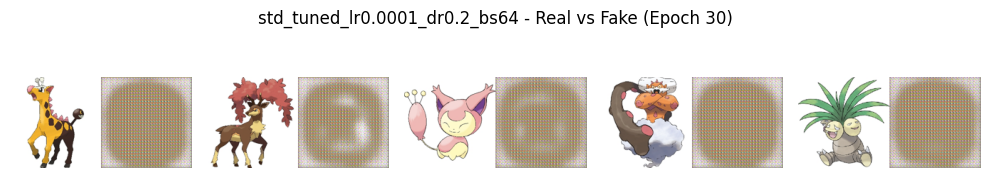

🔥 FID at Epoch 30: 395.25


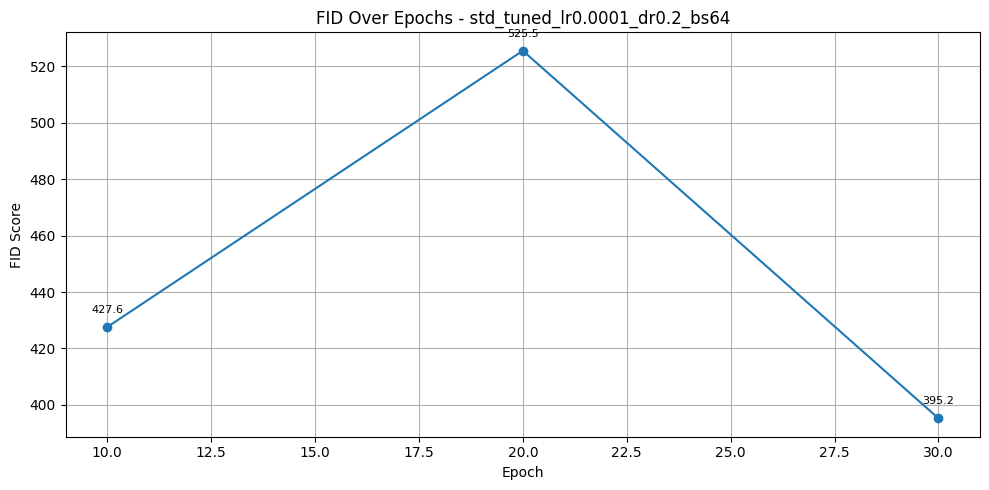

🎯 FID (Standard, Test): 400.93
🔍 Standard GAN Combo: LR=0.0001, Dropout=0.2, Batch=128
Epoch 1 - G: 0.6620 | D: 0.8597
Epoch 2 - G: 0.8085 | D: 0.6116
Epoch 3 - G: 1.5605 | D: 0.2522
Epoch 4 - G: 2.8958 | D: 0.1269
Epoch 5 - G: 2.9350 | D: 0.0629
Epoch 6 - G: 3.5953 | D: 0.0361
Epoch 7 - G: 3.2541 | D: 0.0400
Epoch 8 - G: 3.3324 | D: 0.0375
Epoch 9 - G: 5.2906 | D: 0.0104
Epoch 10 - G: 3.8489 | D: 0.0218


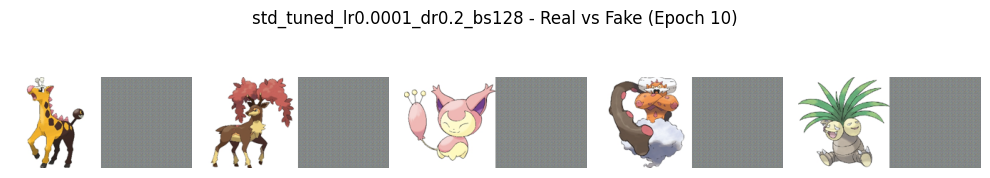

🔥 FID at Epoch 10: 469.87
Epoch 11 - G: 3.8753 | D: 0.0214
Epoch 12 - G: 5.2415 | D: 0.0056
Epoch 13 - G: 3.9599 | D: 0.0200
Epoch 14 - G: 5.0737 | D: 0.0367
Epoch 15 - G: 6.0865 | D: 0.0042
Epoch 16 - G: 6.1180 | D: 0.2121
Epoch 17 - G: 2.3955 | D: 0.1023
Epoch 18 - G: 2.9932 | D: 0.0743
Epoch 19 - G: 4.7370 | D: 0.0628
Epoch 20 - G: 3.9396 | D: 0.0301


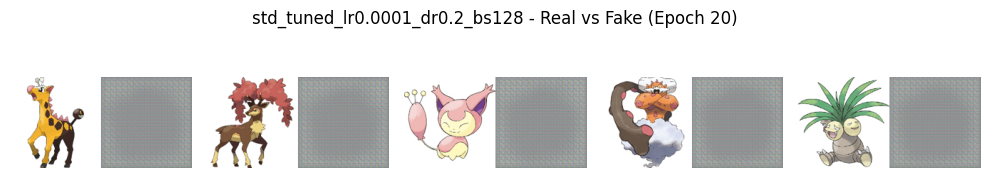

🔥 FID at Epoch 20: 449.96
Epoch 21 - G: 3.5315 | D: 0.0495
Epoch 22 - G: 4.3474 | D: 0.5929
Epoch 23 - G: 2.2493 | D: 0.3240
Epoch 24 - G: 3.5150 | D: 0.2679
Epoch 25 - G: 3.6720 | D: 0.2225
Epoch 26 - G: 3.7297 | D: 0.0877
Epoch 27 - G: 5.3170 | D: 0.0562
Epoch 28 - G: 3.9722 | D: 0.0216
Epoch 29 - G: 3.2771 | D: 0.0426
Epoch 30 - G: 3.6490 | D: 0.0280


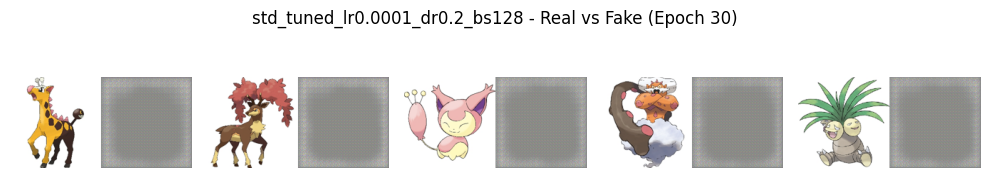

🔥 FID at Epoch 30: 425.12


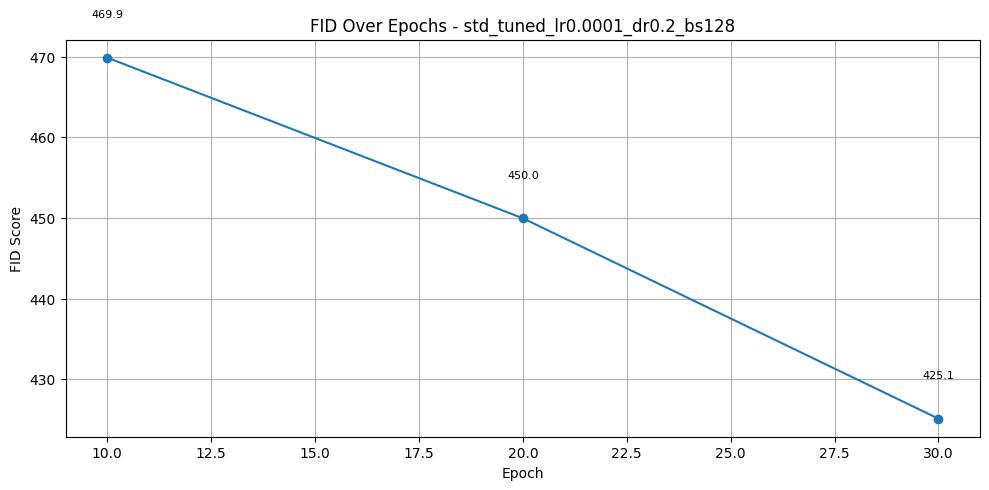

🎯 FID (Standard, Test): 431.38
🔍 Standard GAN Combo: LR=0.0001, Dropout=0.3, Batch=64
Epoch 1 - G: 0.9614 | D: 0.5376
Epoch 2 - G: 2.9843 | D: 0.0602
Epoch 3 - G: 3.3728 | D: 0.0715
Epoch 4 - G: 3.4155 | D: 0.0421
Epoch 5 - G: 4.1927 | D: 0.0168
Epoch 6 - G: 2.8956 | D: 0.0853
Epoch 7 - G: 3.6815 | D: 0.0264
Epoch 8 - G: 4.9568 | D: 0.0106
Epoch 9 - G: 3.5415 | D: 0.0343
Epoch 10 - G: 2.9655 | D: 0.0663


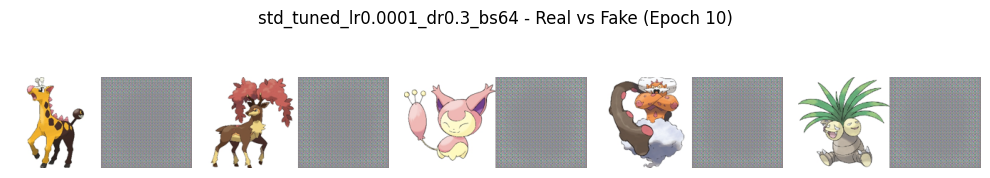

🔥 FID at Epoch 10: 477.94
Epoch 11 - G: 4.6477 | D: 0.0141
Epoch 12 - G: 5.6275 | D: 0.0055
Epoch 13 - G: 3.3494 | D: 0.0510
Epoch 14 - G: 4.5959 | D: 0.0108
Epoch 15 - G: 4.4524 | D: 0.0133
Epoch 16 - G: 7.8103 | D: 0.0286
Epoch 17 - G: 2.8614 | D: 0.1666
Epoch 18 - G: 2.3055 | D: 0.1600
Epoch 19 - G: 5.6377 | D: 0.3239
Epoch 20 - G: 3.2640 | D: 0.2026


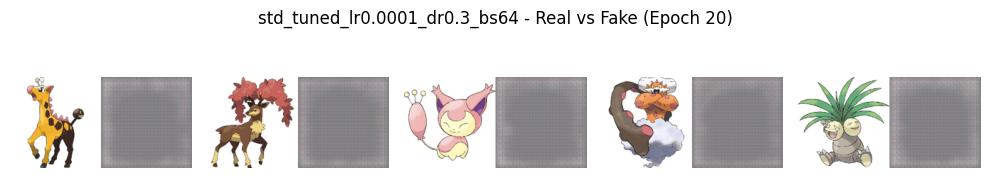

🔥 FID at Epoch 20: 395.24
Epoch 21 - G: 7.2924 | D: 0.1334
Epoch 22 - G: 5.4989 | D: 0.1035
Epoch 23 - G: 3.2302 | D: 0.1285
Epoch 24 - G: 3.5337 | D: 0.0517
Epoch 25 - G: 4.4991 | D: 0.0143
Epoch 26 - G: 5.4111 | D: 0.3113
Epoch 27 - G: 8.7694 | D: 0.0958
Epoch 28 - G: 7.7480 | D: 0.5911
Epoch 29 - G: 3.8413 | D: 0.0300
Epoch 30 - G: 3.1125 | D: 0.0820


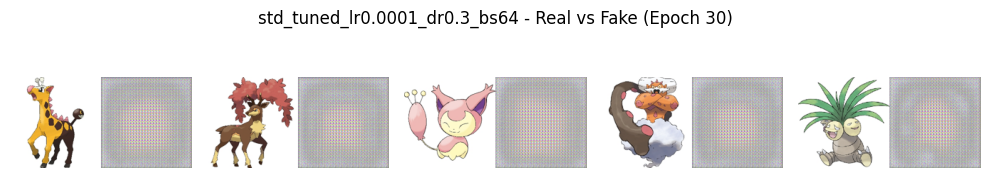

🔥 FID at Epoch 30: 408.00


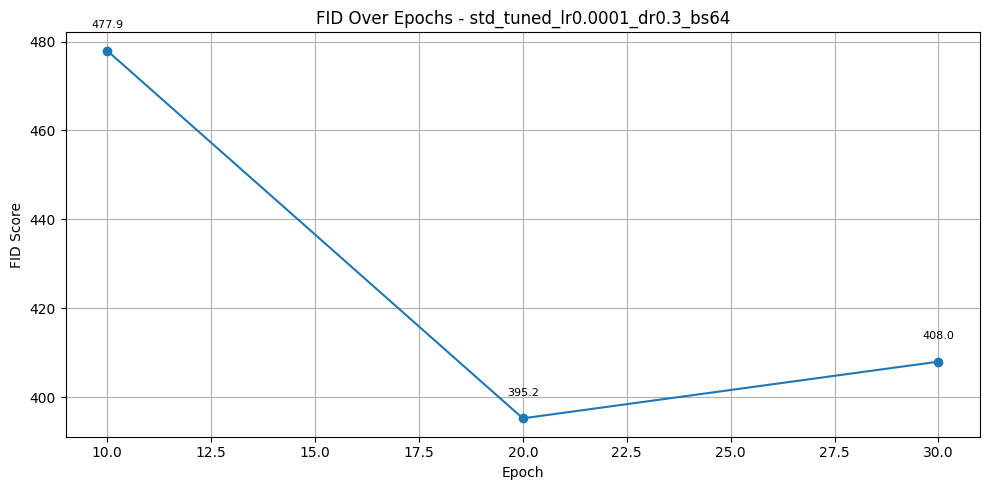

🎯 FID (Standard, Test): 414.75
🔍 Standard GAN Combo: LR=0.0001, Dropout=0.3, Batch=128
Epoch 1 - G: 0.6583 | D: 0.9505
Epoch 2 - G: 1.1548 | D: 0.4248
Epoch 3 - G: 3.0164 | D: 0.0790
Epoch 4 - G: 3.8187 | D: 0.0272
Epoch 5 - G: 3.6859 | D: 0.0266
Epoch 6 - G: 4.6075 | D: 0.0170
Epoch 7 - G: 4.7524 | D: 0.0122
Epoch 8 - G: 5.2478 | D: 0.0106
Epoch 9 - G: 5.0617 | D: 0.0065
Epoch 10 - G: 5.3600 | D: 0.0099


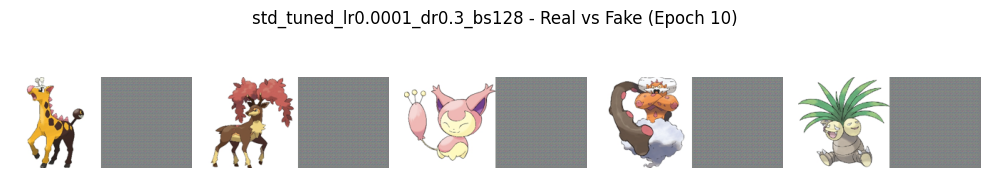

🔥 FID at Epoch 10: 421.47
Epoch 11 - G: 5.4638 | D: 0.0058
Epoch 12 - G: 5.3597 | D: 0.0050
Epoch 13 - G: 6.1885 | D: 0.0022
Epoch 14 - G: 5.3095 | D: 0.0061
Epoch 15 - G: 5.4450 | D: 0.0046
Epoch 16 - G: 5.7329 | D: 0.0041
Epoch 17 - G: 5.6119 | D: 0.0048
Epoch 18 - G: 7.4133 | D: 0.0007
Epoch 19 - G: 5.8935 | D: 0.0031
Epoch 20 - G: 5.2831 | D: 0.0058


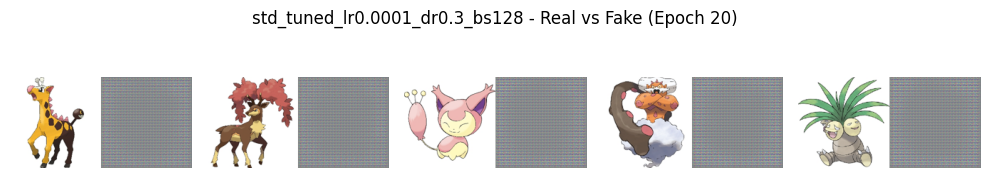

🔥 FID at Epoch 20: 364.28
Epoch 21 - G: 5.5112 | D: 0.0196
Epoch 22 - G: 8.1109 | D: 0.0015
Epoch 23 - G: 6.3896 | D: 0.0828
Epoch 24 - G: 5.3660 | D: 0.0557
Epoch 25 - G: 1.7987 | D: 0.2191
Epoch 26 - G: 5.8143 | D: 0.0236
Epoch 27 - G: 6.2394 | D: 0.3244
Epoch 28 - G: 3.9969 | D: 0.0220
Epoch 29 - G: 2.4281 | D: 0.0985
Epoch 30 - G: 3.0355 | D: 0.0532


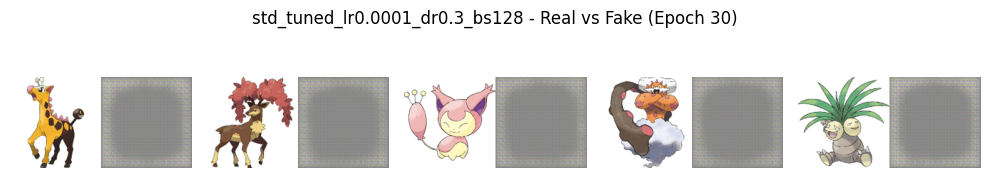

🔥 FID at Epoch 30: 487.19


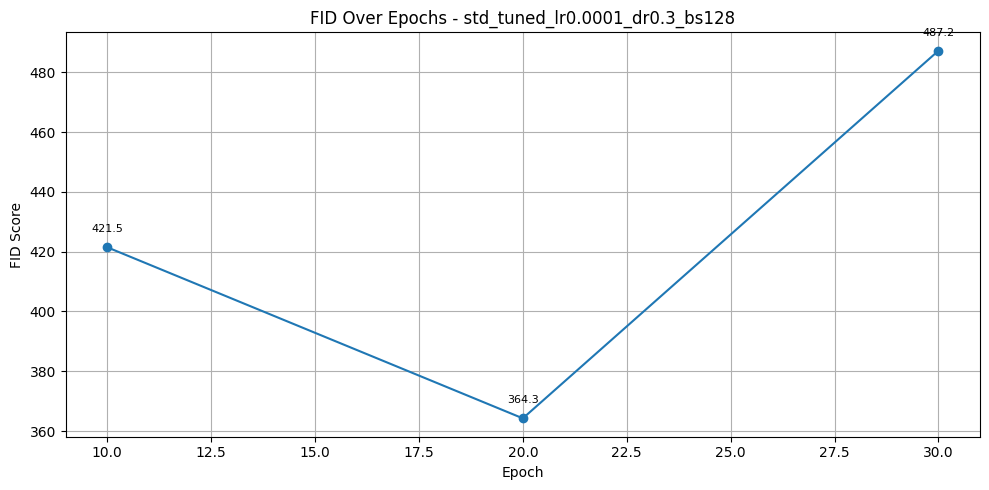

🎯 FID (Standard, Test): 494.03
🔍 Standard GAN Combo: LR=0.0002, Dropout=0.2, Batch=64
Epoch 1 - G: 0.9363 | D: 0.5534
Epoch 2 - G: 2.2815 | D: 0.1181
Epoch 3 - G: 3.1582 | D: 0.0503
Epoch 4 - G: 3.8010 | D: 0.0234
Epoch 5 - G: 3.9002 | D: 0.0208
Epoch 6 - G: 4.5451 | D: 0.0129
Epoch 7 - G: 5.3220 | D: 0.0054
Epoch 8 - G: 5.3247 | D: 0.0061
Epoch 9 - G: 6.4589 | D: 0.0027
Epoch 10 - G: 5.2285 | D: 0.0507


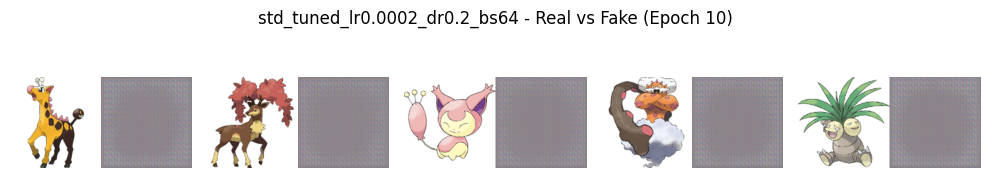

🔥 FID at Epoch 10: 428.09
Epoch 11 - G: 6.8355 | D: 0.0040
Epoch 12 - G: 6.4407 | D: 0.3127
Epoch 13 - G: 3.5188 | D: 0.0448
Epoch 14 - G: 2.2669 | D: 0.1492
Epoch 15 - G: 3.2995 | D: 0.0451
Epoch 16 - G: 4.4490 | D: 0.1935
Epoch 17 - G: 4.4186 | D: 0.0173
Epoch 18 - G: 5.7556 | D: 0.0252
Epoch 19 - G: 6.3699 | D: 0.0091
Epoch 20 - G: 8.7169 | D: 0.0062


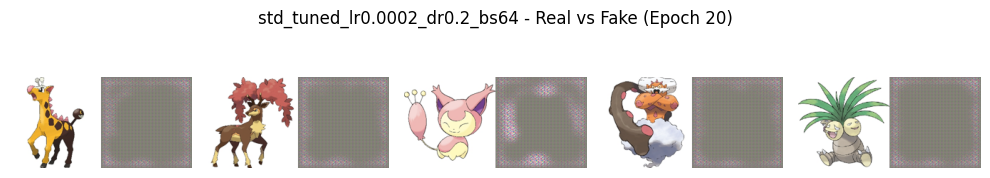

🔥 FID at Epoch 20: 628.14
Epoch 21 - G: 2.8406 | D: 0.1761
Epoch 22 - G: 7.5238 | D: 0.0049
Epoch 23 - G: 6.1543 | D: 0.0045
Epoch 24 - G: 10.0452 | D: 0.0656
Epoch 25 - G: 7.2249 | D: 0.0295
Epoch 26 - G: 7.8121 | D: 0.0583
Epoch 27 - G: 6.5196 | D: 0.0363
Epoch 28 - G: 5.6442 | D: 0.0105
Epoch 29 - G: 3.0510 | D: 0.0727
Epoch 30 - G: 5.0130 | D: 0.1426


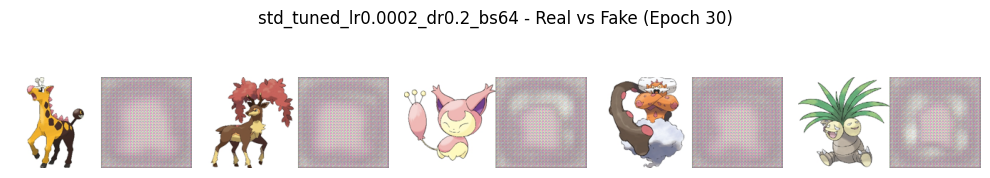

🔥 FID at Epoch 30: 438.43


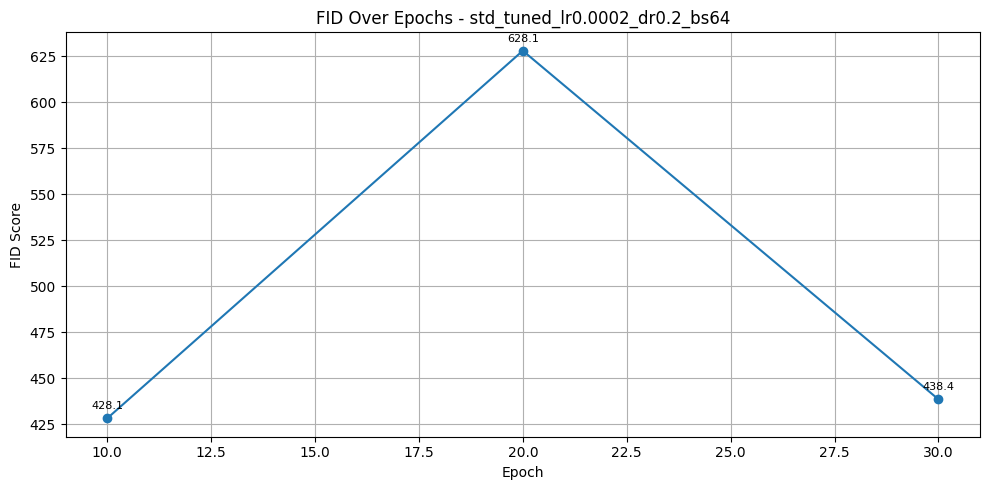

🎯 FID (Standard, Test): 446.36
🔍 Standard GAN Combo: LR=0.0002, Dropout=0.2, Batch=128
Epoch 1 - G: 0.8155 | D: 0.8116
Epoch 2 - G: 1.6045 | D: 0.2323
Epoch 3 - G: 3.5798 | D: 0.0300
Epoch 4 - G: 3.2122 | D: 0.0492
Epoch 5 - G: 2.5061 | D: 0.0853
Epoch 6 - G: 4.1391 | D: 0.0176
Epoch 7 - G: 3.3307 | D: 0.0367
Epoch 8 - G: 3.3191 | D: 0.0386
Epoch 9 - G: 3.6009 | D: 0.0374
Epoch 10 - G: 3.9505 | D: 0.0270


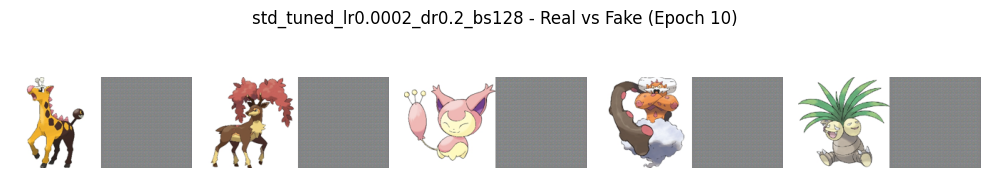

🔥 FID at Epoch 10: 428.35
Epoch 11 - G: 4.3836 | D: 0.0573
Epoch 12 - G: 4.4072 | D: 0.0194
Epoch 13 - G: 5.0123 | D: 0.0342
Epoch 14 - G: 1.8881 | D: 0.1990
Epoch 15 - G: 2.1431 | D: 0.3249
Epoch 16 - G: 3.2310 | D: 0.1440
Epoch 17 - G: 3.8979 | D: 0.0491
Epoch 18 - G: 4.8931 | D: 0.3731
Epoch 19 - G: 4.3641 | D: 0.0198
Epoch 20 - G: 2.9427 | D: 0.1924


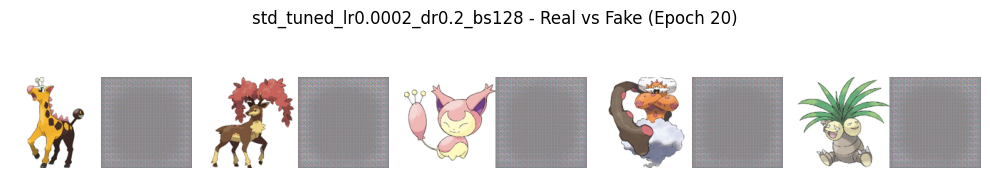

🔥 FID at Epoch 20: 451.42
Epoch 21 - G: 2.3034 | D: 0.1141
Epoch 22 - G: 3.4066 | D: 0.0527
Epoch 23 - G: 3.5277 | D: 0.0309
Epoch 24 - G: 4.8799 | D: 0.2793
Epoch 25 - G: 4.5134 | D: 0.0741
Epoch 26 - G: 3.5739 | D: 0.0668
Epoch 27 - G: 2.7156 | D: 0.2775
Epoch 28 - G: 1.9894 | D: 0.1632
Epoch 29 - G: 2.5593 | D: 0.3449
Epoch 30 - G: 2.0616 | D: 0.2118


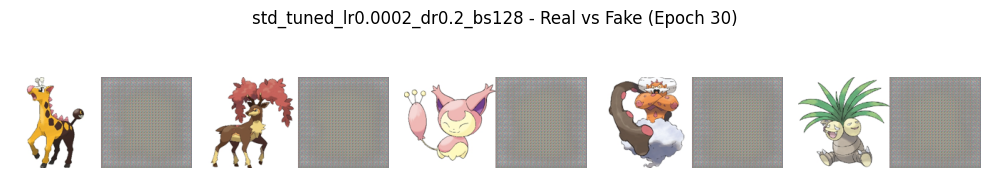

🔥 FID at Epoch 30: 433.39


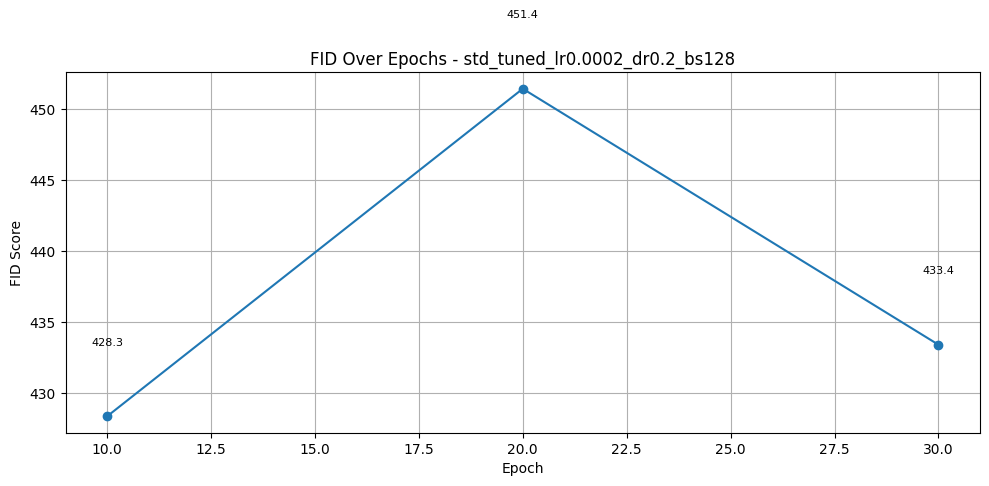

🎯 FID (Standard, Test): 440.09
🔍 Standard GAN Combo: LR=0.0002, Dropout=0.3, Batch=64
Epoch 1 - G: 1.1605 | D: 0.4190
Epoch 2 - G: 3.7488 | D: 0.0300
Epoch 3 - G: 3.3737 | D: 0.0814
Epoch 4 - G: 3.2549 | D: 0.0409
Epoch 5 - G: 4.6981 | D: 0.0839
Epoch 6 - G: 3.4219 | D: 0.0874
Epoch 7 - G: 4.6228 | D: 0.0125
Epoch 8 - G: 5.2467 | D: 0.0289
Epoch 9 - G: 4.0223 | D: 0.0294
Epoch 10 - G: 5.3227 | D: 0.0059


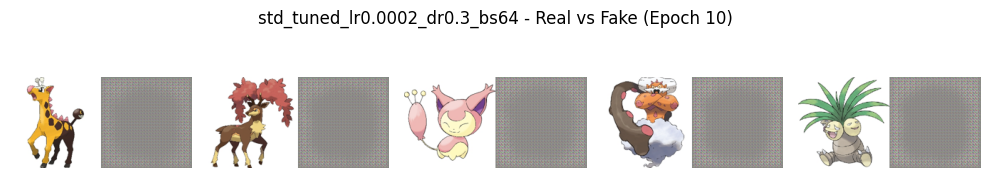

🔥 FID at Epoch 10: 509.63
Epoch 11 - G: 3.7653 | D: 0.0296
Epoch 12 - G: 3.5373 | D: 0.0510
Epoch 13 - G: 4.7258 | D: 0.0095
Epoch 14 - G: 3.9715 | D: 0.0418
Epoch 15 - G: 5.2189 | D: 0.2113
Epoch 16 - G: 4.2096 | D: 0.0339
Epoch 17 - G: 9.7494 | D: 0.2350
Epoch 18 - G: 6.6064 | D: 0.1754
Epoch 19 - G: 4.5879 | D: 0.0466
Epoch 20 - G: 4.6889 | D: 0.0199


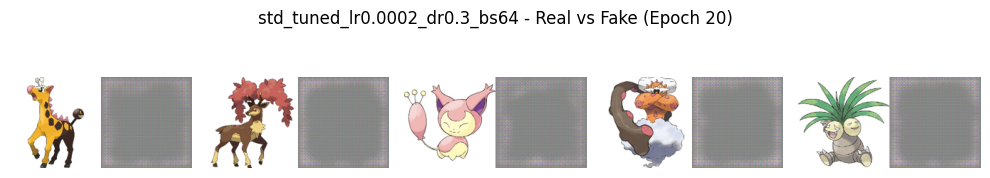

🔥 FID at Epoch 20: 464.34
Epoch 21 - G: 4.0128 | D: 0.0429
Epoch 22 - G: 3.3881 | D: 0.2826
Epoch 23 - G: 5.8690 | D: 0.0137
Epoch 24 - G: 5.7586 | D: 0.0650
Epoch 25 - G: 6.4359 | D: 0.1389
Epoch 26 - G: 6.6039 | D: 0.0566
Epoch 27 - G: 6.4232 | D: 0.0140
Epoch 28 - G: 6.1026 | D: 0.0505
Epoch 29 - G: 6.9396 | D: 0.0032
Epoch 30 - G: 5.8285 | D: 0.0052


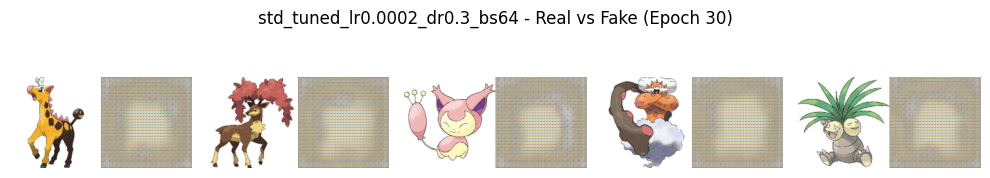

🔥 FID at Epoch 30: 341.67


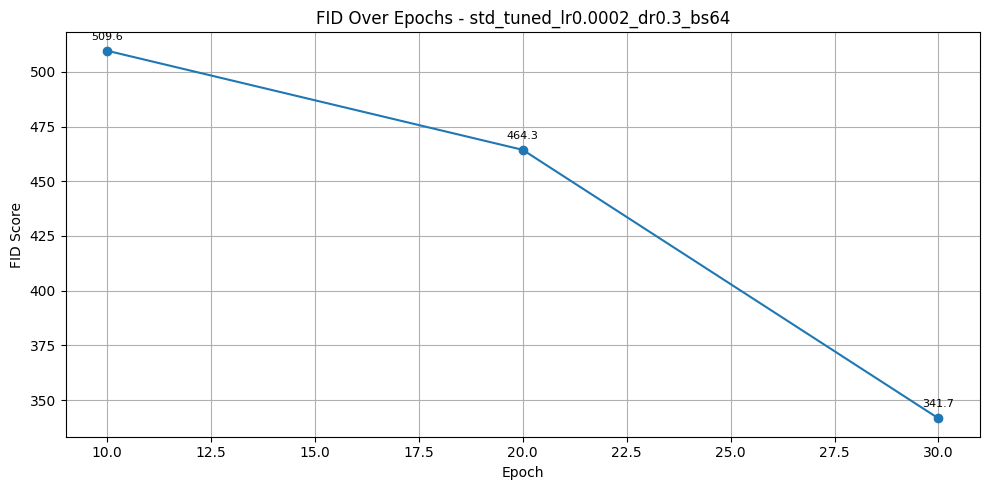

🎯 FID (Standard, Test): 350.92
🔍 Standard GAN Combo: LR=0.0002, Dropout=0.3, Batch=128
Epoch 1 - G: 0.6574 | D: 0.8310
Epoch 2 - G: 1.2891 | D: 0.3412
Epoch 3 - G: 3.1131 | D: 0.0588
Epoch 4 - G: 3.6361 | D: 0.0377
Epoch 5 - G: 3.1237 | D: 0.0482
Epoch 6 - G: 4.2662 | D: 0.1202
Epoch 7 - G: 3.7626 | D: 0.0297
Epoch 8 - G: 3.7476 | D: 0.1367
Epoch 9 - G: 4.6986 | D: 0.0537
Epoch 10 - G: 5.1339 | D: 0.0084


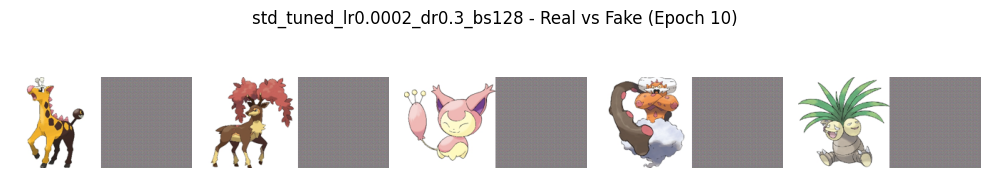

🔥 FID at Epoch 10: 406.41
Epoch 11 - G: 3.3820 | D: 0.0354
Epoch 12 - G: 6.8379 | D: 0.0018
Epoch 13 - G: 4.6299 | D: 0.0103
Epoch 14 - G: 6.5238 | D: 0.0053
Epoch 15 - G: 5.1044 | D: 0.0144
Epoch 16 - G: 4.8241 | D: 0.0110
Epoch 17 - G: 5.5324 | D: 0.0070
Epoch 18 - G: 4.7512 | D: 0.0107
Epoch 19 - G: 6.0033 | D: 0.0056
Epoch 20 - G: 5.7421 | D: 0.0034


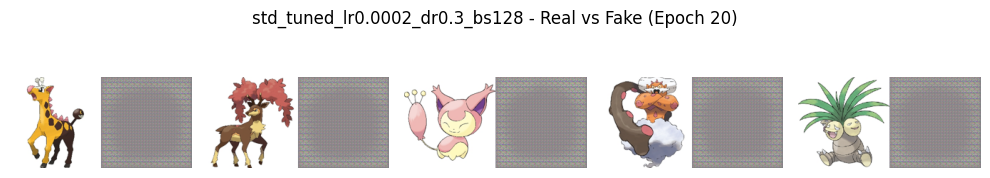

🔥 FID at Epoch 20: 414.57
Epoch 21 - G: 7.0892 | D: 0.0155
Epoch 22 - G: 6.3620 | D: 0.0127
Epoch 23 - G: 4.8118 | D: 0.0098
Epoch 24 - G: 3.3240 | D: 0.0477
Epoch 25 - G: 4.7674 | D: 0.0113
Epoch 26 - G: 4.2899 | D: 0.0441
Epoch 27 - G: 3.3559 | D: 0.0949
Epoch 28 - G: 4.7706 | D: 0.0396
Epoch 29 - G: 3.1441 | D: 0.0707
Epoch 30 - G: 2.7563 | D: 0.0993


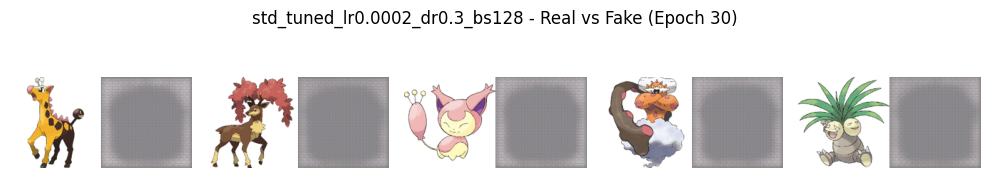

🔥 FID at Epoch 30: 427.83


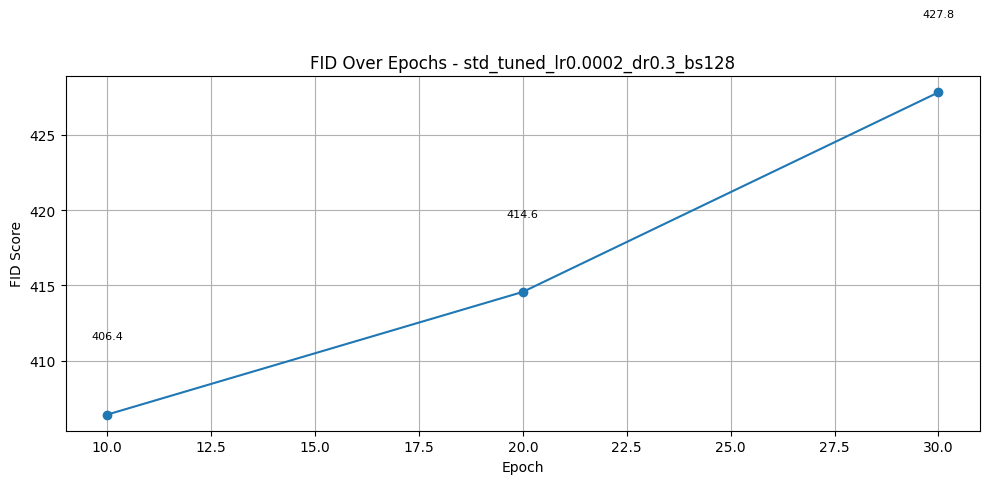

🎯 FID (Standard, Test): 435.30

🏆 Best Standard DCGAN Params:
LR: 0.0002, Dropout: 0.3, Batch: 64
Best FID: 350.92


In [18]:
print("\n🚀 Starting Hyperparameter Tuning for Standard DCGAN...\n")

for lr, dropout, bsz in param_combos:
    print(f"🔍 Standard GAN Combo: LR={lr}, Dropout={dropout}, Batch={bsz}")
    BATCH_SIZE = bsz

    def tuned_std_generator():
        model = tf.keras.Sequential([
            layers.Dense(16 * 16 * 256, input_dim=LATENT_DIM),
            layers.Reshape((16, 16, 256)),                    # 16x16x256
            layers.BatchNormalization(),
            layers.ReLU(),
            layers.Conv2DTranspose(128, 4, strides=2, padding='same'),  # 32x32x128
            layers.BatchNormalization(),
            layers.ReLU(),
            layers.Conv2DTranspose(64, 4, strides=2, padding='same'),   # 64x64x64
            layers.BatchNormalization(),
            layers.ReLU(),
            layers.Conv2DTranspose(3, 4, strides=2, padding='same', activation='tanh')  # 128x128x3
        ])
        return model


    def tuned_std_discriminator():
        model = tf.keras.Sequential([
            layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3)),
            layers.Conv2D(64, 4, strides=2, padding="same"),   # 64x64x64
            layers.LeakyReLU(0.2),
            layers.Conv2D(128, 4, strides=2, padding="same"),  # 32x32x128
            layers.LeakyReLU(0.2),
            layers.Conv2D(256, 4, strides=2, padding="same"),  # 16x16x256
            layers.LeakyReLU(0.2),
            layers.Dropout(dropout),
            layers.Flatten(),                                 # 16*16*256 = 65536
            layers.Dense(1, activation='sigmoid')
        ])
        return model



    std_gen = tuned_std_generator()
    std_disc = tuned_std_discriminator()

    train_dcgan(std_gen, std_disc, train_images, f"std_tuned_lr{lr}_dr{dropout}_bs{bsz}")
    fake_path = os.path.join(SAVE_DIR, f"fid_std_tuned_lr{lr}_dr{dropout}_bs{bsz}")
    fid = calculate_fid(os.path.join(SAVE_DIR, "fid_real_test"), fake_path)

    print(f"🎯 FID (Standard, Test): {fid:.2f}")
    if fid < best_fid_std:
        best_fid_std = fid
        best_combo_std = (lr, dropout, bsz)
        best_model_std = std_gen

print("\n🏆 Best Standard DCGAN Params:")
print(f"LR: {best_combo_std[0]}, Dropout: {best_combo_std[1]}, Batch: {best_combo_std[2]}")
print(f"Best FID: {best_fid_std:.2f}")

# Restore original values
EPOCHS = original_epochs
BATCH_SIZE = original_batch_size

# GAN Evaluation (FID on train + test) - After Hyperparameter Tuning

In [19]:
print("\n📊 Final Evaluation AFTER Hyperparameter Tuning\n")

# ---------------- Custom GAN ----------------
FAKE_CUS_TRAIN = os.path.join(SAVE_DIR, "fake_custom_best_train")
FAKE_CUS_TEST = os.path.join(SAVE_DIR, "fake_custom_best_test")
generate_fid_images(best_model_cus, FAKE_CUS_TRAIN)
generate_fid_images(best_model_cus, FAKE_CUS_TEST)

fid_cus_train = calculate_fid(os.path.join(SAVE_DIR, "fid_real_train"), FAKE_CUS_TRAIN)
fid_cus_test = calculate_fid(os.path.join(SAVE_DIR, "fid_real_test"), FAKE_CUS_TEST)

Xtr_cus, Xte_cus, ytr_cus, yte_cus = load_classifier_data(best_model_cus, train_images)
clf_cus = build_classifier()
clf_cus.fit(Xtr_cus, ytr_cus, epochs=5, verbose=0)
acc_cus_train = clf_cus.evaluate(Xtr_cus, ytr_cus, verbose=0)[1]
acc_cus_test = clf_cus.evaluate(Xte_cus, yte_cus, verbose=0)[1]

# ---------------- Standard GAN ----------------
FAKE_STD_TRAIN = os.path.join(SAVE_DIR, "fake_standard_best_train")
FAKE_STD_TEST = os.path.join(SAVE_DIR, "fake_standard_best_test")
generate_fid_images(best_model_std, FAKE_STD_TRAIN)
generate_fid_images(best_model_std, FAKE_STD_TEST)

fid_std_train = calculate_fid(os.path.join(SAVE_DIR, "fid_real_train"), FAKE_STD_TRAIN)
fid_std_test = calculate_fid(os.path.join(SAVE_DIR, "fid_real_test"), FAKE_STD_TEST)

Xtr_std, Xte_std, ytr_std, yte_std = load_classifier_data(best_model_std, train_images)
clf_std = build_classifier()
clf_std.fit(Xtr_std, ytr_std, epochs=5, verbose=0)
acc_std_train = clf_std.evaluate(Xtr_std, ytr_std, verbose=0)[1]
acc_std_test = clf_std.evaluate(Xte_std, yte_std, verbose=0)[1]

# ---------------- Summary Table ----------------
print("\n🏁 Final Evaluation After Hyperparameter Tuning:")

print("\n🔧 Best Custom DCGAN")
print(f"FID (Train): {fid_cus_train:.2f} | FID (Test): {fid_cus_test:.2f}")
print(f"Classifier Acc (Train): {acc_cus_train:.2%} | (Test): {acc_cus_test:.2%}")

print("\n🔧 Best Standard DCGAN")
print(f"FID (Train): {fid_std_train:.2f} | FID (Test): {fid_std_test:.2f}")
print(f"Classifier Acc (Train): {acc_std_train:.2%} | (Test): {acc_std_test:.2%}")


📊 Final Evaluation AFTER Hyperparameter Tuning

✅ Final shape: X=(1310, 128, 128, 3), y=(1310,)
✅ Final shape: X=(1310, 128, 128, 3), y=(1310,)

🏁 Final Evaluation After Hyperparameter Tuning:

🔧 Best Custom DCGAN
FID (Train): 330.60 | FID (Test): 331.99
Classifier Acc (Train): 0.00% | (Test): 0.00%

🔧 Best Standard DCGAN
FID (Train): 343.04 | FID (Test): 349.62
Classifier Acc (Train): 0.00% | (Test): 0.00%
